# Choosing the Right Chart Type

This notebook provides a comprehensive guide to selecting the most effective chart types for different data visualization scenarios. We'll explore various visualization options, when to use them, and best practices for implementation.

## 1. Import Required Libraries

First, we need to import the necessary libraries for creating our visualizations.

In [1]:
# Import essential visualization and data handling libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings

# Set visualization styles and options
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12, 8)
warnings.filterwarnings('ignore')

# For displaying plots in the notebook
%matplotlib inline

## 2. Understanding Chart Type Selection

Selecting the right chart type is crucial for effective data visualization. The choice depends on several factors:

- **Data characteristics**: The type of data you have (categorical, numerical, time-series, etc.)
- **Analysis purpose**: What you're trying to communicate (comparison, distribution, relationship, composition, etc.)
- **Audience needs**: Who will consume the visualization and their data literacy level
- **Story/message**: The key insights you want to highlight

Let's create a sample dataset to use throughout this notebook:

In [2]:
# Create sample sales data for demonstration
np.random.seed(42)

# Create a DataFrame with sales data
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
regions = ['North', 'South', 'East', 'West', 'Central']
products = ['Product A', 'Product B', 'Product C']

# Create an empty list to store the data
data = []

# Generate sample data
for month in months:
    for region in regions:
        for product in products:
            sales = np.random.randint(100, 1000)
            profit = sales * np.random.uniform(0.1, 0.4)
            units = np.random.randint(10, 100)
            data.append({
                'Month': month,
                'Region': region,
                'Product': product,
                'Sales': sales,
                'Profit': profit,
                'Units': units
            })

# Create DataFrame
sales_df = pd.DataFrame(data)

# Add a categorical column for sizes
sizes = ['Small', 'Medium', 'Large']
sales_df['Size'] = np.random.choice(sizes, size=len(sales_df))

# Display the first few rows of the DataFrame
sales_df.head()

,Month,Region,Product,Sales,Profit,Units,Size
0,Jan,North,Product A,202,68.470505,24,Large
1,Jan,North,Product B,206,68.784904,30,Large
2,Jan,North,Product C,714,166.897376,96,Medium
3,Jan,South,Product A,430,102.243107,33,Large
4,Jan,South,Product B,230,24.420330,11,Small


## 3. Common Chart Types and Their Use Cases

This section explores various chart types, when to use them, and provides code examples for implementation.

### 3.1 Bar Charts

**Use when**: Comparing quantities across categories

**Best for**:
- Comparing values across categories
- Showing frequency counts
- Displaying ranked data

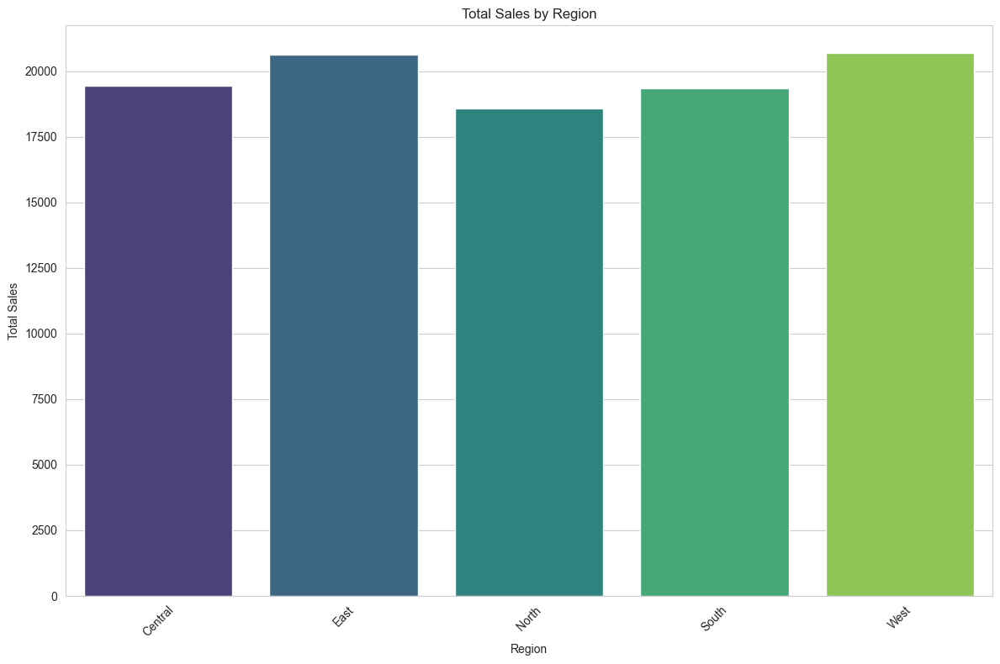

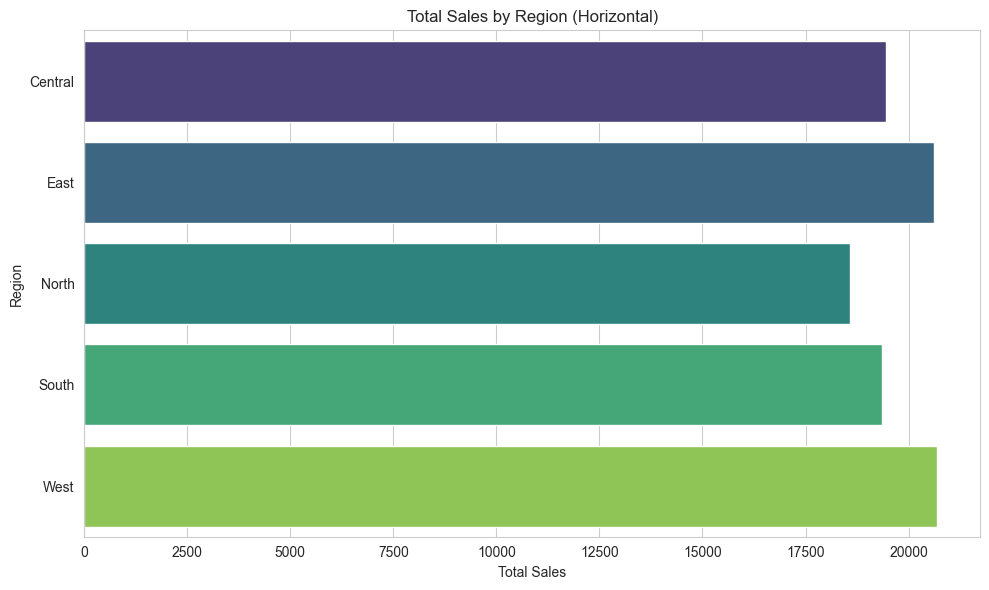

In [3]:
# Example 1: Simple Bar Chart - Total Sales by Region
region_sales = sales_df.groupby('Region')['Sales'].sum().reset_index()

fig, ax = plt.subplots()
sns.barplot(x='Region', y='Sales', data=region_sales, palette='viridis', ax=ax)
ax.set_title('Total Sales by Region')
ax.set_xlabel('Region')
ax.set_ylabel('Total Sales')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Example 2: Horizontal Bar Chart - Better for many categories or long labels
plt.figure(figsize=(10, 6))
sns.barplot(y='Region', x='Sales', data=region_sales, palette='viridis')
plt.title('Total Sales by Region (Horizontal)')
plt.xlabel('Total Sales')
plt.ylabel('Region')
plt.tight_layout()
plt.show()

### 3.2 Grouped and Stacked Bar Charts

**Use when**: Comparing multiple categories or showing composition within categories

**Best for**:
- Comparing values across multiple categories
- Showing part-to-whole relationships within categories

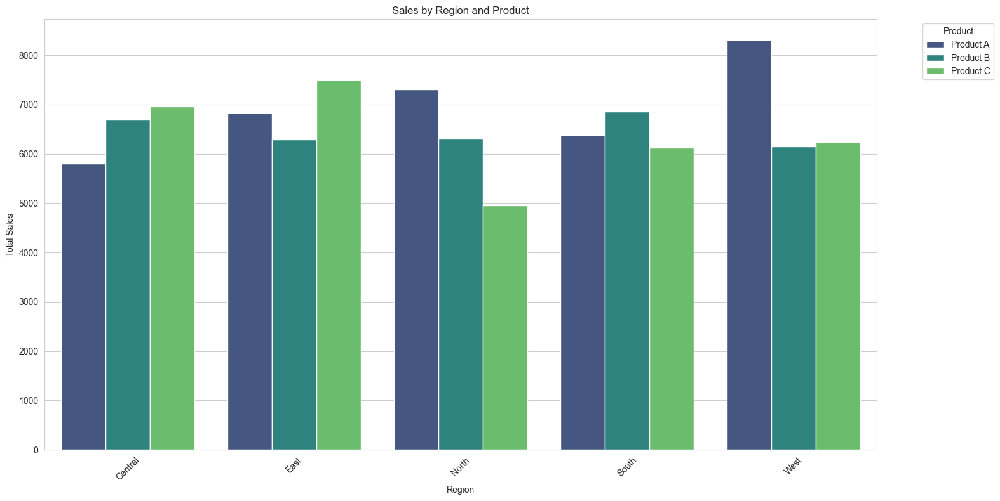

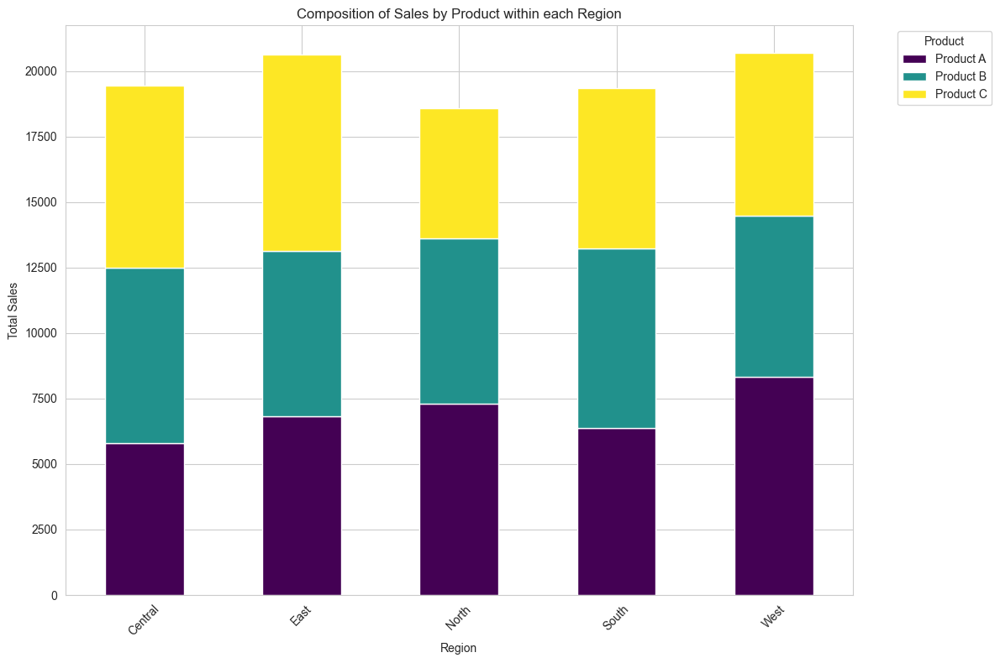

In [4]:
# Example 1: Grouped Bar Chart - Sales by Region and Product
region_product_sales = sales_df.groupby(['Region', 'Product'])['Sales'].sum().reset_index()

plt.figure(figsize=(14, 8))
sns.barplot(x='Region', y='Sales', hue='Product', data=region_product_sales, palette='viridis')
plt.title('Sales by Region and Product')
plt.xlabel('Region')
plt.ylabel('Total Sales')
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(title='Product', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

# Example 2: Stacked Bar Chart - Composition of Sales by Product within each Region
region_product_wide = region_product_sales.pivot(index='Region', columns='Product', values='Sales')

region_product_wide.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='viridis')
plt.title('Composition of Sales by Product within each Region')
plt.xlabel('Region')
plt.ylabel('Total Sales')
plt.xticks(rotation=45)
plt.legend(title='Product', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### 3.3 Line Charts

**Use when**: Showing trends over time or continuous data

**Best for**:
- Time-series data
- Showing changes over time
- Comparing trends between different groups

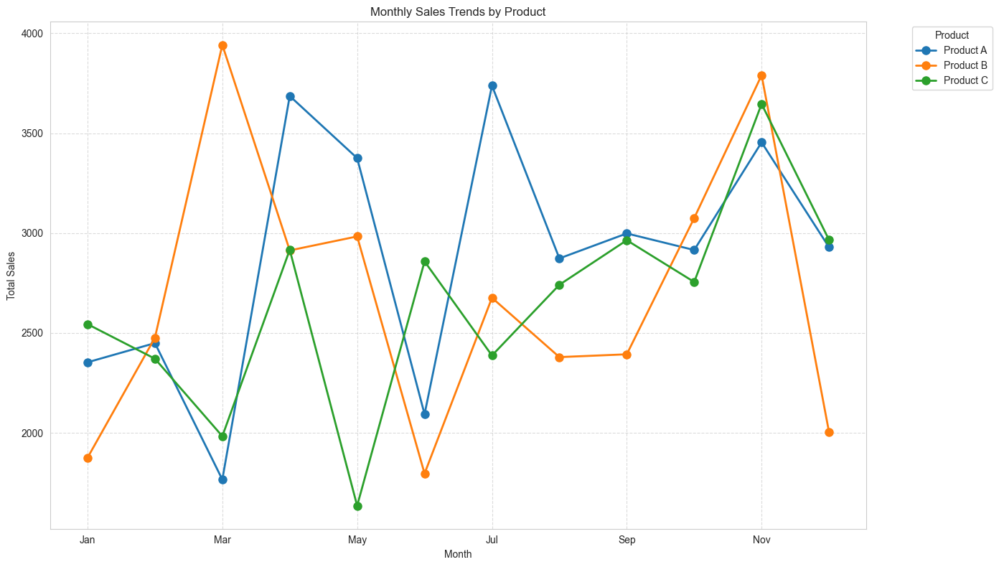

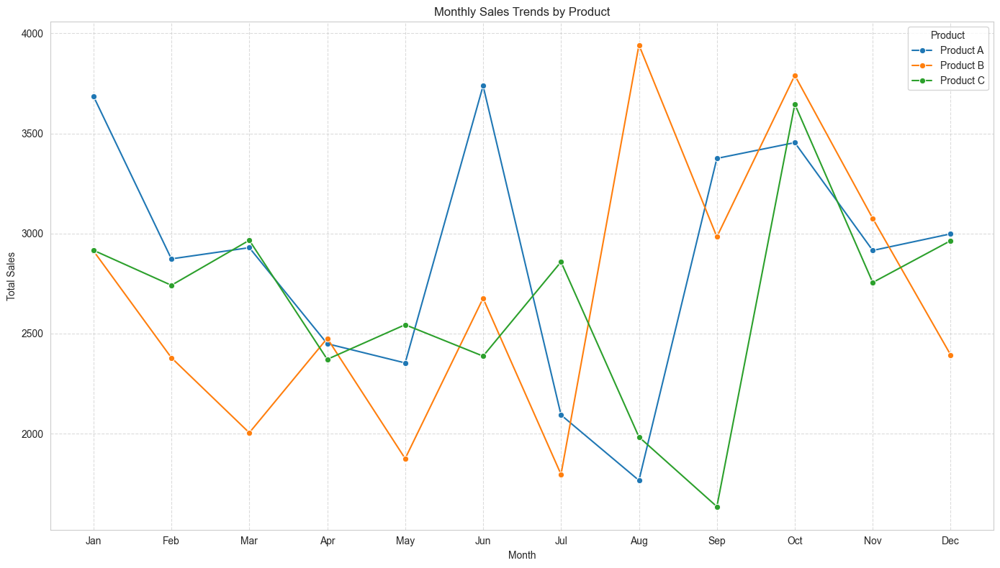

In [5]:
# Example: Line Chart - Monthly Sales Trends
monthly_sales = sales_df.groupby(['Month', 'Product'])['Sales'].sum().reset_index()

# Create a pivot table for easier plotting
monthly_pivot = monthly_sales.pivot(index='Month', columns='Product', values='Sales')

# Reorder months chronologically
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
monthly_pivot = monthly_pivot.reindex(month_order)

# Plot the data
plt.figure(figsize=(14, 8))
monthly_pivot.plot(marker='o', linestyle='-', linewidth=2, markersize=8, ax=plt.gca())
plt.title('Monthly Sales Trends by Product')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Product', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Alternative with Seaborn for a different style
plt.figure(figsize=(14, 8))
sns.lineplot(data=monthly_sales, x='Month', y='Sales', hue='Product', marker='o', sort=False)
plt.title('Monthly Sales Trends by Product')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.xticks(range(len(month_order)), month_order)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 3.4 Scatter Plots

**Use when**: Examining relationships between two continuous variables

**Best for**:
- Correlation analysis
- Identifying patterns or clusters
- Detecting outliers

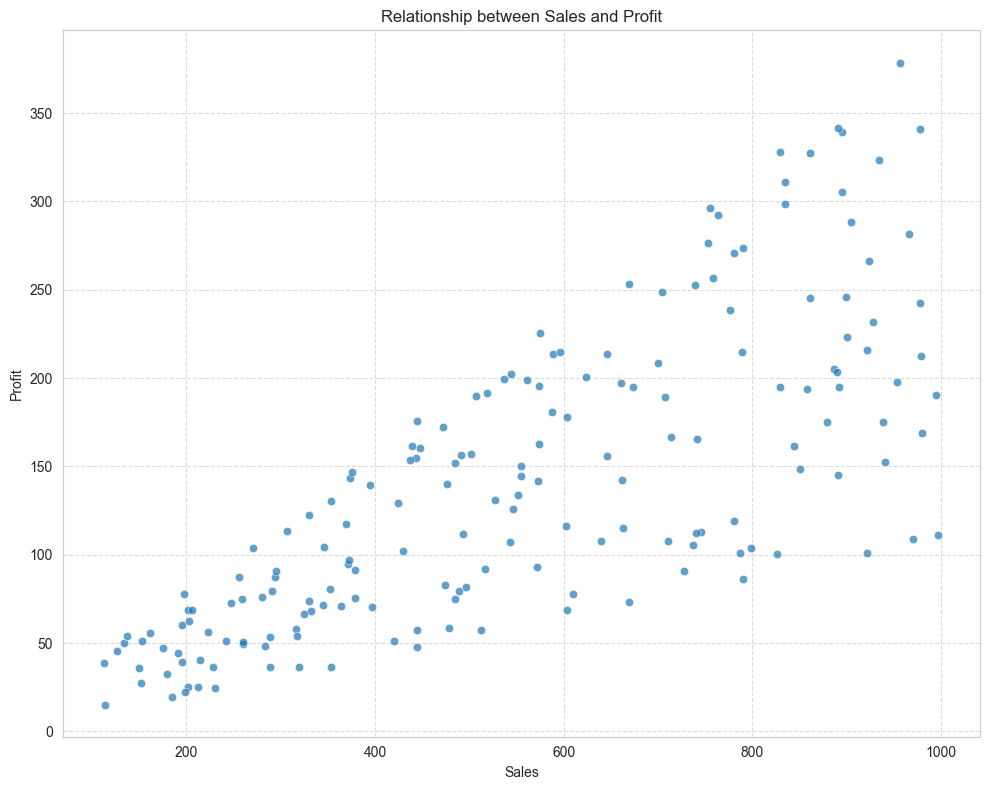

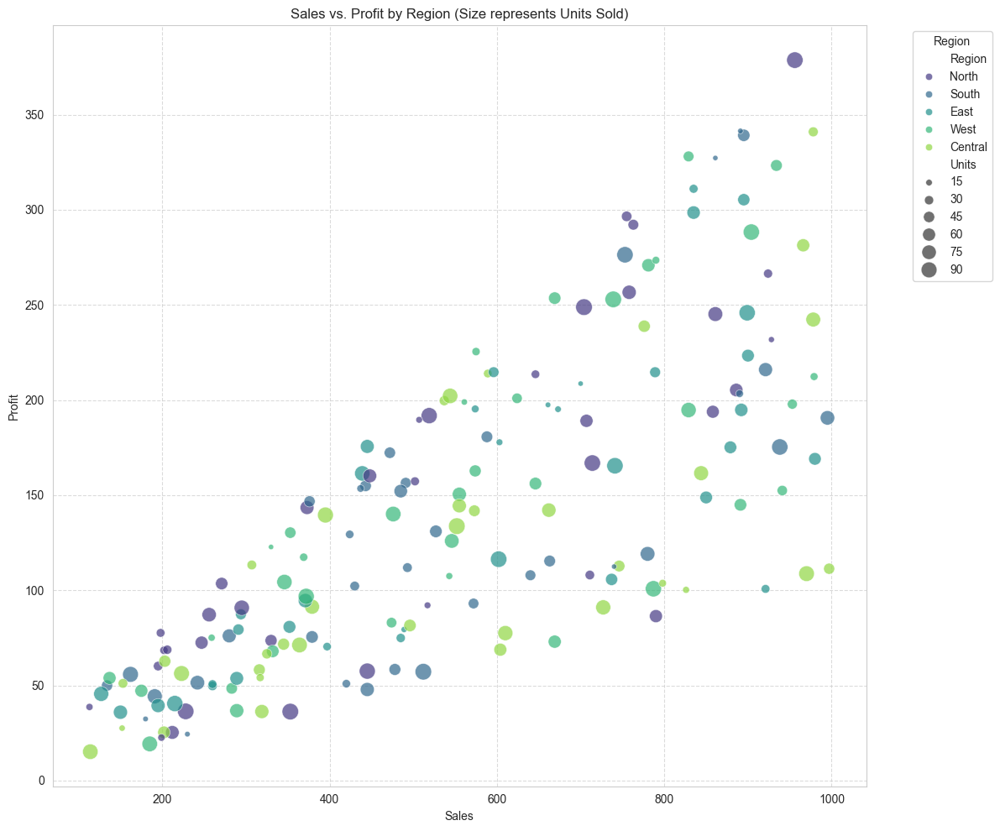

In [6]:
# Example 1: Basic Scatter Plot - Relationship between Sales and Profit
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Sales', y='Profit', data=sales_df, alpha=0.7)
plt.title('Relationship between Sales and Profit')
plt.xlabel('Sales')
plt.ylabel('Profit')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Example 2: Enhanced Scatter Plot with Size and Color
plt.figure(figsize=(12, 10))
sns.scatterplot(x='Sales', y='Profit', size='Units', hue='Region', 
                data=sales_df, sizes=(20, 200), alpha=0.7, palette='viridis')
plt.title('Sales vs. Profit by Region (Size represents Units Sold)')
plt.xlabel('Sales')
plt.ylabel('Profit')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### 3.5 Pie Charts and Donut Charts

**Use when**: Showing composition or part-to-whole relationships

**Best for**:
- Showing proportions of a whole
- Works best with a small number of categories (≤ 6)
- When the segments add up to a meaningful whole

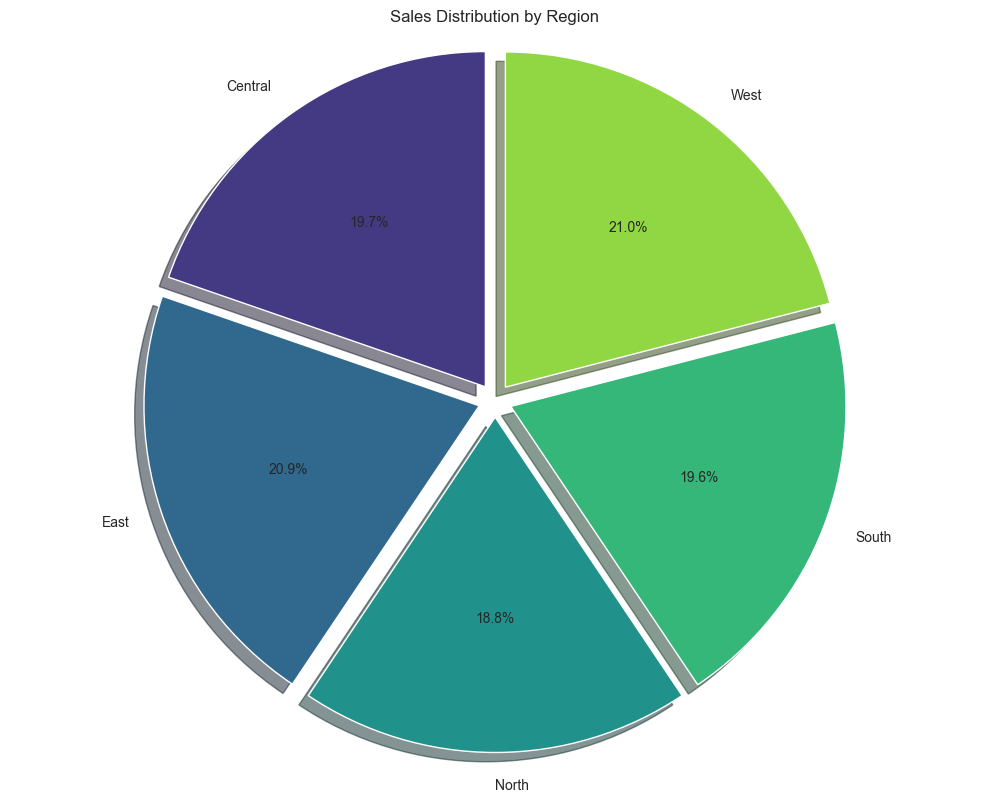

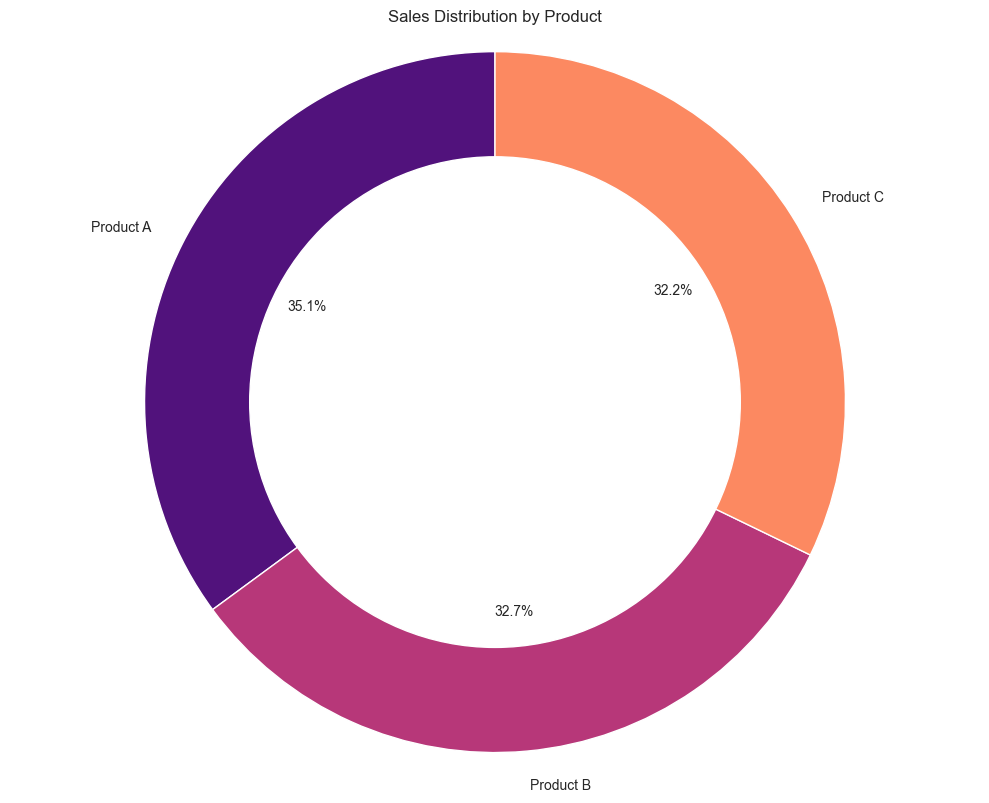

In [7]:
# Example 1: Pie Chart - Sales Distribution by Region
region_sales = sales_df.groupby('Region')['Sales'].sum()

plt.figure(figsize=(10, 8))
plt.pie(region_sales, labels=region_sales.index, autopct='%1.1f%%', startangle=90,
        shadow=True, explode=[0.05] * len(region_sales), colors=sns.color_palette('viridis', len(region_sales)))
plt.title('Sales Distribution by Region')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.tight_layout()
plt.show()

# Example 2: Donut Chart - Sales Distribution by Product
product_sales = sales_df.groupby('Product')['Sales'].sum()

fig, ax = plt.subplots(figsize=(10, 8))
wedges, texts, autotexts = ax.pie(
    product_sales, labels=product_sales.index, autopct='%1.1f%%',
    startangle=90, colors=sns.color_palette('magma', len(product_sales))
)

# Create a white circle at the center to make it a donut chart
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
fig.gca().add_artist(centre_circle)

plt.title('Sales Distribution by Product')
plt.axis('equal')
plt.tight_layout()
plt.show()

### 3.6 Histograms

**Use when**: Examining the distribution of a single continuous variable

**Best for**:
- Understanding the distribution and spread of data
- Identifying patterns, central tendency, and outliers
- Checking for normality and skewness

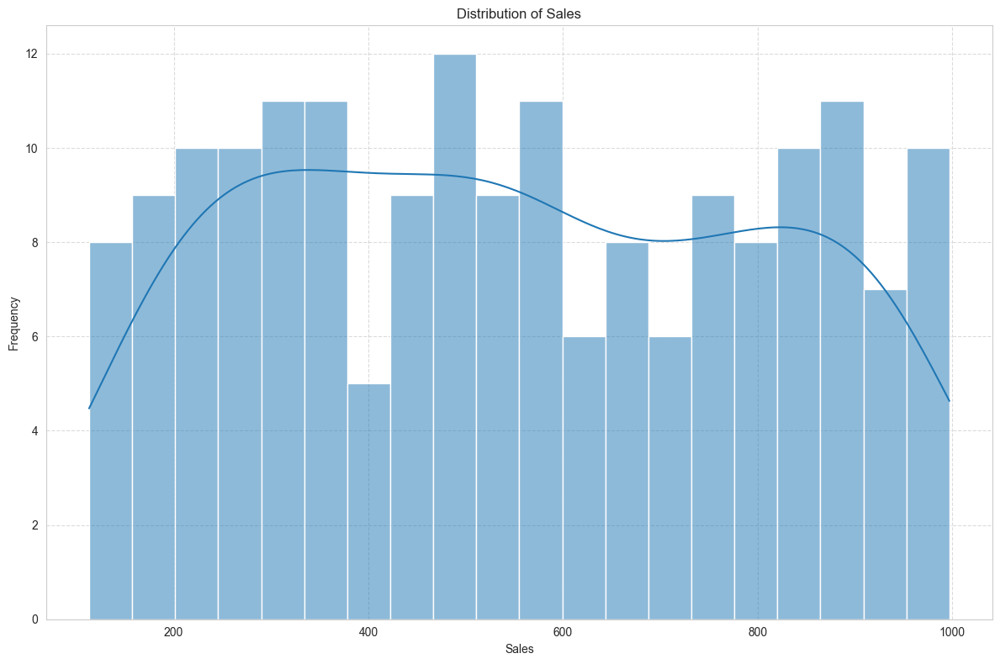

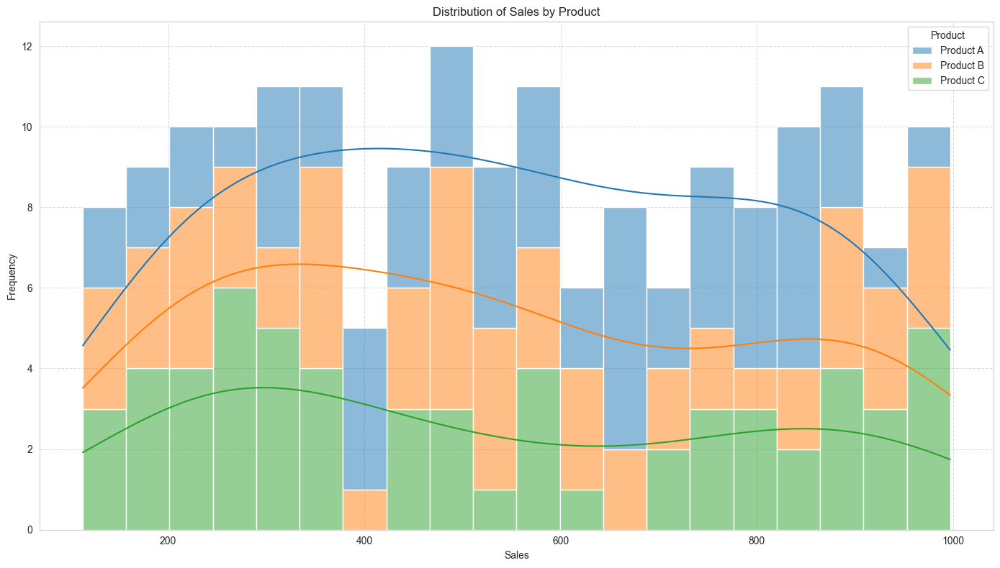

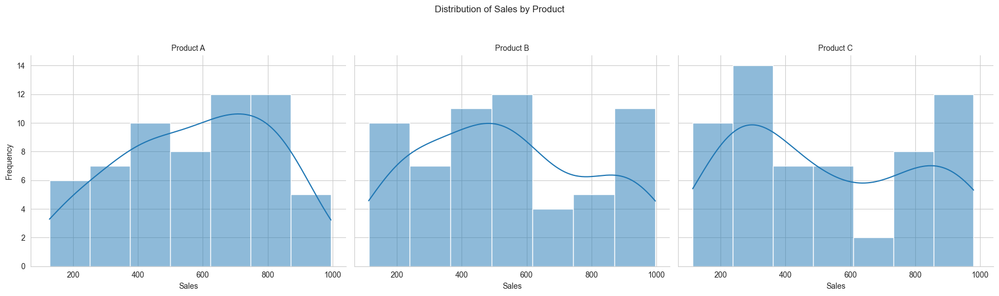

In [8]:
# Example 1: Basic Histogram - Distribution of Sales
plt.figure(figsize=(12, 8))
sns.histplot(sales_df['Sales'], bins=20, kde=True)
plt.title('Distribution of Sales')
plt.xlabel('Sales')
plt.ylabel('Frequency')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Example 2: Multiple Histograms - Distribution of Sales by Product
plt.figure(figsize=(14, 8))
sns.histplot(data=sales_df, x='Sales', hue='Product', bins=20, kde=True, multiple='stack')
plt.title('Distribution of Sales by Product')
plt.xlabel('Sales')
plt.ylabel('Frequency')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Example 3: Side-by-Side Histograms using FacetGrid
g = sns.FacetGrid(sales_df, col='Product', height=5, aspect=1.2)
g.map_dataframe(sns.histplot, x='Sales', kde=True)
g.set_axis_labels('Sales', 'Frequency')
g.set_titles('{col_name}')
g.fig.suptitle('Distribution of Sales by Product', y=1.05)
g.tight_layout()
plt.show()

### 3.7 Box Plots and Violin Plots

**Use when**: Comparing distributions across categories or groups

**Best for**:
- Visualizing distribution summary statistics
- Identifying outliers
- Comparing distributions across groups

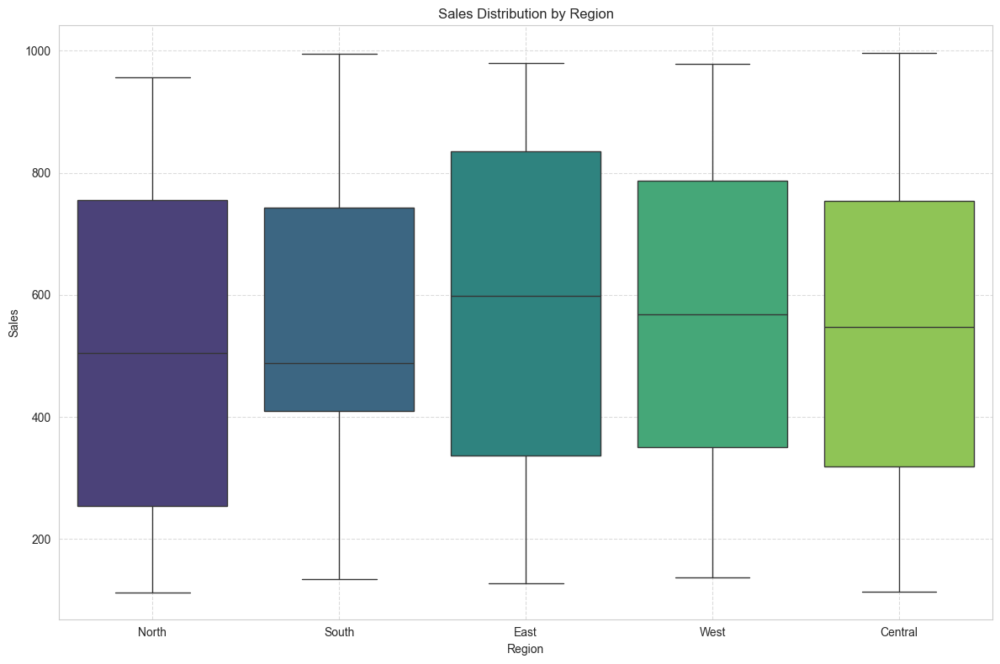

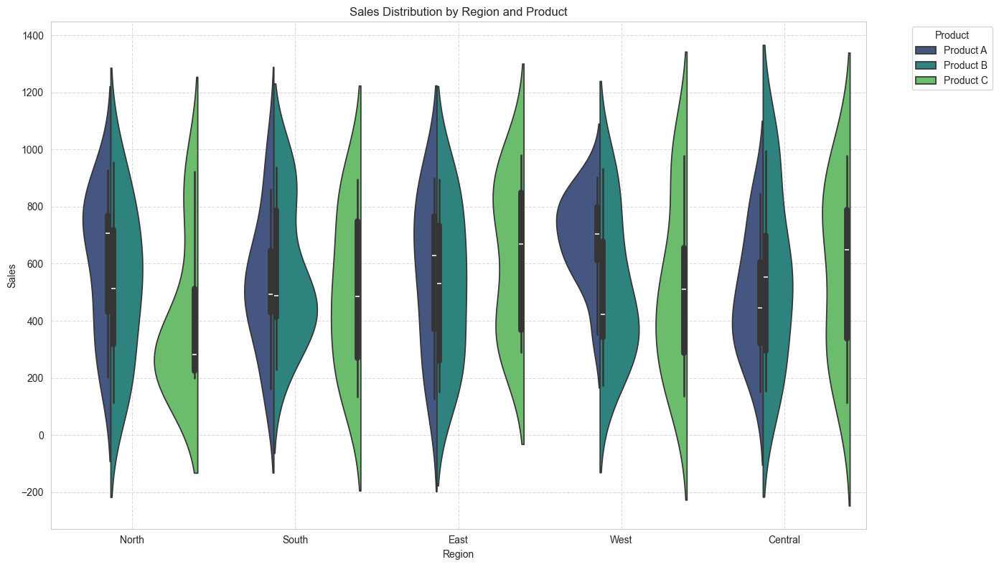

In [9]:
# Example 1: Box Plot - Sales Distribution by Region
plt.figure(figsize=(12, 8))
sns.boxplot(x='Region', y='Sales', data=sales_df, palette='viridis')
plt.title('Sales Distribution by Region')
plt.xlabel('Region')
plt.ylabel('Sales')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Example 2: Violin Plot - More detailed distribution visualization
plt.figure(figsize=(14, 8))
sns.violinplot(x='Region', y='Sales', hue='Product', data=sales_df, palette='viridis', split=True)
plt.title('Sales Distribution by Region and Product')
plt.xlabel('Region')
plt.ylabel('Sales')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Product', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

### 3.8 Heatmaps

**Use when**: Showing patterns or correlations in a matrix format

**Best for**:
- Correlation matrices
- Showing relationships between variables
- Visualizing complex multi-dimensional data

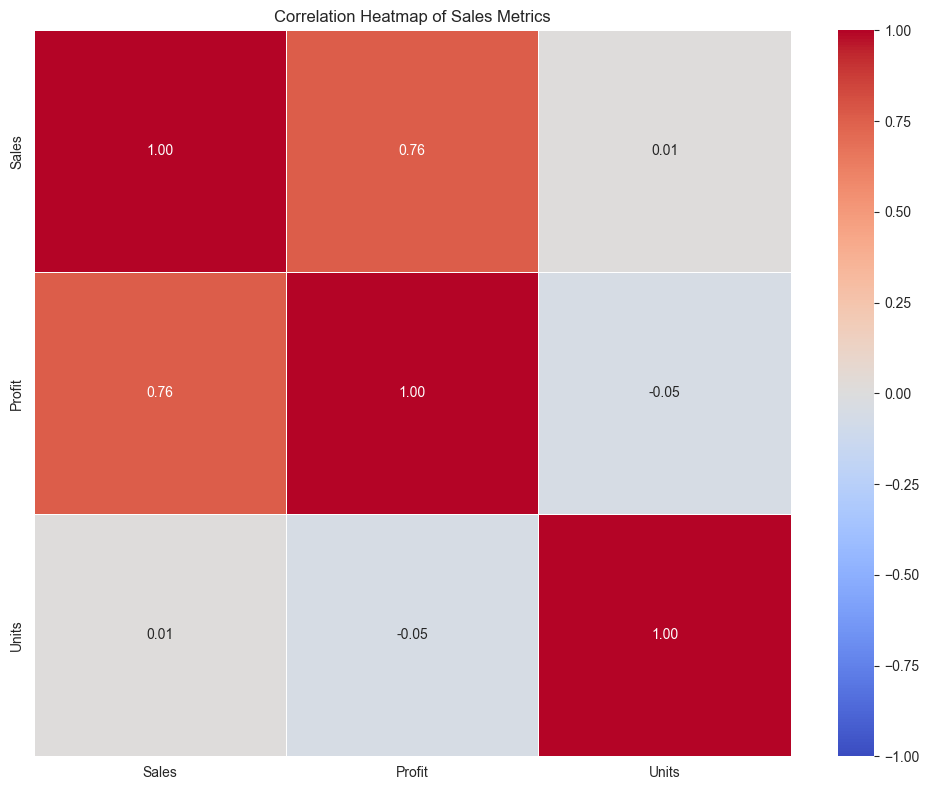

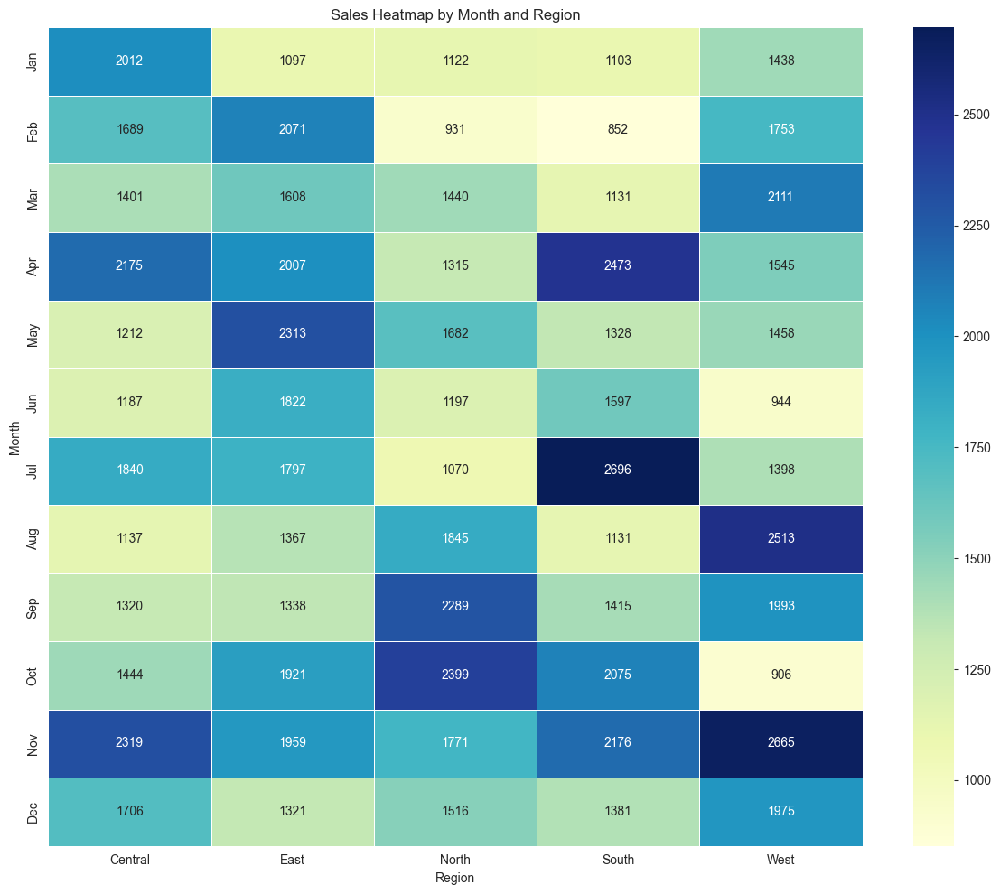

In [10]:
# Example 1: Correlation Heatmap
correlation = sales_df[['Sales', 'Profit', 'Units']].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap of Sales Metrics')
plt.tight_layout()
plt.show()

# Example 2: Sales Heatmap by Month and Region
# Create a pivot table for the heatmap
month_region_sales = sales_df.groupby(['Month', 'Region'])['Sales'].sum().reset_index()
heatmap_data = month_region_sales.pivot(index='Month', columns='Region', values='Sales')

# Reorder months chronologically
heatmap_data = heatmap_data.reindex(month_order)

plt.figure(figsize=(12, 10))
sns.heatmap(heatmap_data, annot=True, fmt='.0f', cmap='YlGnBu', linewidths=0.5)
plt.title('Sales Heatmap by Month and Region')
plt.ylabel('Month')
plt.xlabel('Region')
plt.tight_layout()
plt.show()

### 3.9 Bubble Charts

**Use when**: Displaying relationships between three numerical variables

**Best for**:
- Adding a third dimension to scatter plots
- Comparing multiple metrics across categories

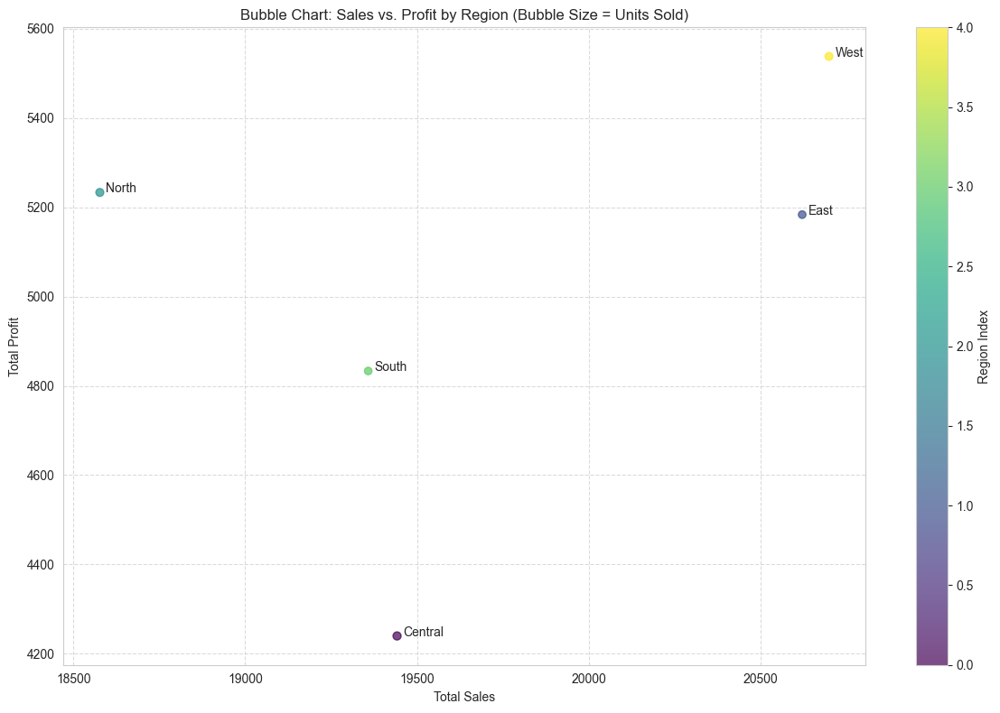

In [11]:
# Example: Bubble Chart using Plotly - Sales vs Profit with Units as Bubble Size
region_summary = sales_df.groupby('Region').agg({
    'Sales': 'sum',
    'Profit': 'sum',
    'Units': 'sum'
}).reset_index()

fig = px.scatter(region_summary, x='Sales', y='Profit', size='Units', color='Region',
                 hover_name='Region', text='Region', size_max=60,
                 title='Bubble Chart: Sales vs. Profit by Region (Bubble Size = Units Sold)')

fig.update_layout(
    xaxis_title='Total Sales',
    yaxis_title='Total Profit',
    legend_title='Region',
    height=600, width=900
)

# Display the figure
fig.show()

# Alternative with Matplotlib
plt.figure(figsize=(12, 8))
plt.scatter(region_summary['Sales'], region_summary['Profit'], 
            s=region_summary['Units']/50, alpha=0.7,
            c=range(len(region_summary)), cmap='viridis')

# Add labels for each bubble
for i, row in region_summary.iterrows():
    plt.annotate(row['Region'], 
                 xy=(row['Sales'], row['Profit']),
                 xytext=(5, 0), textcoords='offset points')

plt.colorbar(label='Region Index')
plt.title('Bubble Chart: Sales vs. Profit by Region (Bubble Size = Units Sold)')
plt.xlabel('Total Sales')
plt.ylabel('Total Profit')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 3.10 Radar/Spider Charts

**Use when**: Comparing multiple variables across multiple categories

**Best for**:
- Performance metrics across dimensions
- Comparing entities across multiple variables

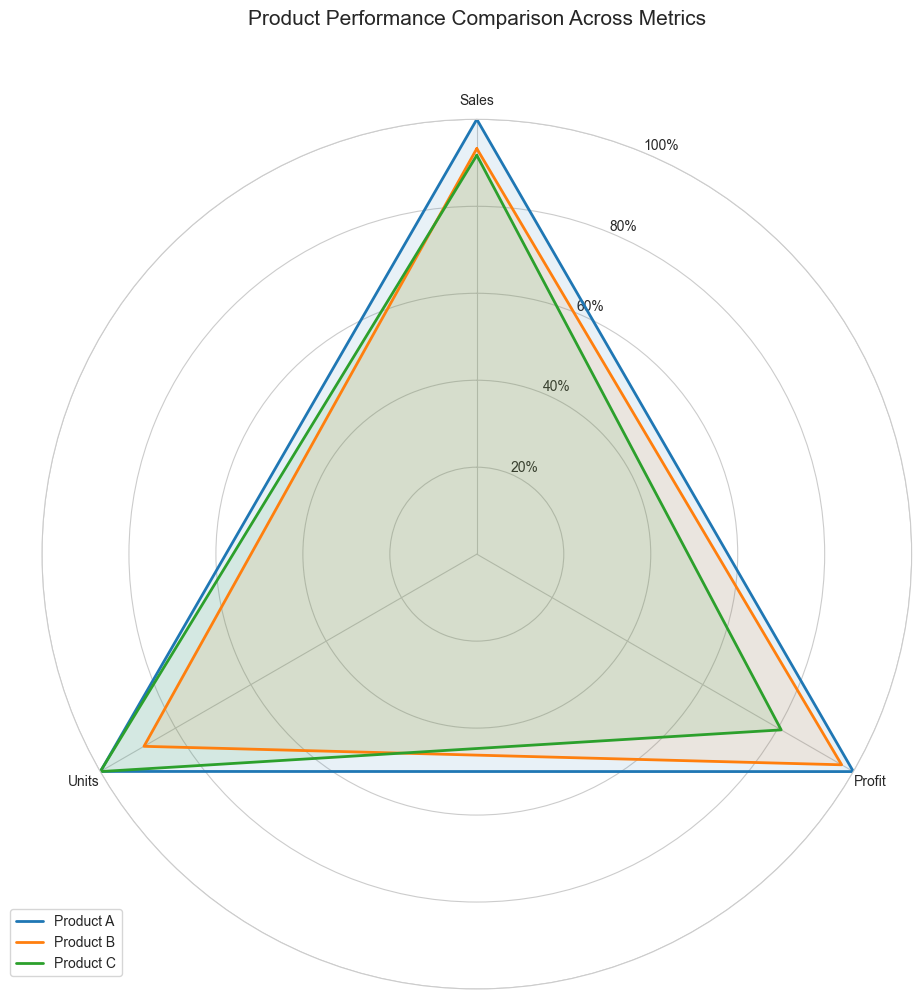

In [12]:
# Example: Radar Chart - Product Performance across Multiple Metrics
import math

# Prepare data for the radar chart
metrics = ['Sales', 'Profit', 'Units']
product_metrics = sales_df.groupby('Product')[metrics].mean().reset_index()

# Normalize the data for better visualization
for metric in metrics:
    product_metrics[f'{metric}_normalized'] = product_metrics[metric] / product_metrics[metric].max()

# Number of variables
N = len(metrics)
angles = [n / float(N) * 2 * math.pi for n in range(N)]
angles += angles[:1]  # Close the loop

# Create the plot
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(polar=True))

# Plot each product
for i, product in enumerate(product_metrics['Product']):
    values = product_metrics.loc[i, [f'{m}_normalized' for m in metrics]].tolist()
    values += values[:1]  # Close the loop
    
    ax.plot(angles, values, linewidth=2, label=product)
    ax.fill(angles, values, alpha=0.1)

# Fix axis to go in the right order and start at 12 o'clock
ax.set_theta_offset(math.pi / 2)
ax.set_theta_direction(-1)

# Draw axis lines for each angle and label
ax.set_xticks(angles[:-1])
ax.set_xticklabels(metrics)

# Draw y-axis labels (0-100%)
ax.set_yticks([0.2, 0.4, 0.6, 0.8, 1.0])
ax.set_yticklabels(['20%', '40%', '60%', '80%', '100%'])
ax.set_ylim(0, 1)

# Add legend
plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
plt.title('Product Performance Comparison Across Metrics', size=15, y=1.1)
plt.tight_layout()
plt.show()

## 4. Decision Framework for Chart Selection

When selecting the appropriate chart type, consider these questions:

1. **What is your goal?** (Comparison, Composition, Distribution, Relationship, Trend)
2. **What type of data do you have?** (Categorical, Numerical, Time Series)
3. **How many variables are you analyzing?** (One, Two, Three or more)

Let's implement a simple decision framework to help select the right chart type:

In [13]:
def recommend_chart(data_type, analysis_goal, variables_count):
    """
    Recommends chart types based on data characteristics and analysis goals
    
    Parameters:
    data_type (str): 'categorical', 'numerical', or 'time_series'
    analysis_goal (str): 'comparison', 'composition', 'distribution', 'relationship', or 'trend'
    variables_count (int): Number of variables (1, 2, 3+)
    
    Returns:
    list: Recommended chart types
    """
    recommendations = []
    
    # Comparison
    if analysis_goal == 'comparison':
        if data_type == 'categorical':
            recommendations.append('Bar Chart')
            if variables_count >= 2:
                recommendations.append('Grouped Bar Chart')
            if variables_count >= 3:
                recommendations.append('Heatmap')
        elif data_type == 'numerical':
            recommendations.append('Box Plot')
            recommendations.append('Violin Plot')
        elif data_type == 'time_series':
            recommendations.append('Line Chart')
            if variables_count >= 2:
                recommendations.append('Multi-line Chart')
    
    # Composition
    elif analysis_goal == 'composition':
        if data_type == 'categorical':
            if variables_count == 1:
                recommendations.append('Pie Chart')
                recommendations.append('Donut Chart')
            else:
                recommendations.append('Stacked Bar Chart')
                recommendations.append('Treemap')
        elif data_type == 'time_series':
            recommendations.append('Stacked Area Chart')
    
    # Distribution
    elif analysis_goal == 'distribution':
        if data_type == 'numerical':
            recommendations.append('Histogram')
            recommendations.append('Density Plot')
            if variables_count >= 2:
                recommendations.append('Box Plot')
                recommendations.append('Violin Plot')
        elif data_type == 'categorical':
            recommendations.append('Bar Chart')
    
    # Relationship
    elif analysis_goal == 'relationship':
        if variables_count >= 2:
            if data_type == 'numerical':
                recommendations.append('Scatter Plot')
                if variables_count >= 3:
                    recommendations.append('Bubble Chart')
                    recommendations.append('3D Scatter Plot')
            recommendations.append('Heatmap')
            if variables_count >= 3:
                recommendations.append('Radar Chart')
    
    # Trend
    elif analysis_goal == 'trend':
        if data_type == 'time_series':
            recommendations.append('Line Chart')
            if variables_count >= 2:
                recommendations.append('Multi-line Chart')
            if variables_count >= 3:
                recommendations.append('Heatmap')
    
    if not recommendations:
        recommendations.append('Consider alternative visualization methods')
        
    return recommendations

# Example usage
print("Comparing sales across regions (categorical, comparison, 1 variable):")
print(recommend_chart('categorical', 'comparison', 1))

print("\nShowing sales distribution (numerical, distribution, 1 variable):")
print(recommend_chart('numerical', 'distribution', 1))

print("\nExamining relationship between sales and profit (numerical, relationship, 2 variables):")
print(recommend_chart('numerical', 'relationship', 2))

print("\nAnalyzing sales trends over time (time_series, trend, 1 variable):")
print(recommend_chart('time_series', 'trend', 1))

print("\nComparing product composition within regions (categorical, composition, 2 variables):")
print(recommend_chart('categorical', 'composition', 2))

Comparing sales across regions (categorical, comparison, 1 variable):
['Bar Chart']

Showing sales distribution (numerical, distribution, 1 variable):
['Histogram', 'Density Plot']

Examining relationship between sales and profit (numerical, relationship, 2 variables):
['Scatter Plot', 'Heatmap']

Analyzing sales trends over time (time_series, trend, 1 variable):
['Line Chart']

Comparing product composition within regions (categorical, composition, 2 variables):
['Stacked Bar Chart', 'Treemap']


## 5. Chart Type Comparison

Let's compare different chart types using the same dataset to demonstrate how the choice of visualization affects data interpretation and insights.

### 5.1 Comparing Sales by Region Using Different Charts

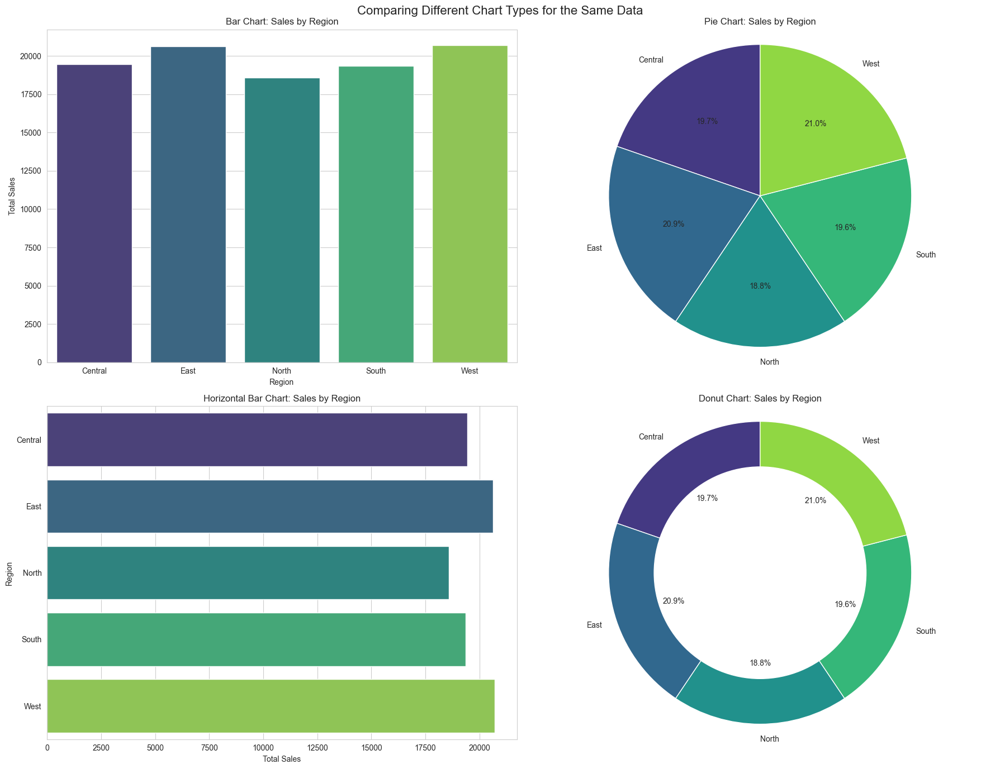


Chart Type Comparison for Regional Sales Data:

1. Bar Chart: 
   - Strengths: Precise comparison of values, easy to read exact differences
   - Best when: You want to precisely compare quantities

2. Pie Chart:
   - Strengths: Shows proportion of each region to the whole (percentage)
   - Best when: You want to show part-to-whole relationships

3. Horizontal Bar Chart:
   - Strengths: Same as vertical bar but better for long labels or many categories
   - Best when: You have many categories or long category names

4. Donut Chart:
   - Strengths: Similar to pie chart but with space in center for additional information
   - Best when: You want to show part-to-whole relationships but need space for total



In [14]:
# Prepare data for comparison
region_sales = sales_df.groupby('Region')['Sales'].sum().reset_index()

# Create a figure with subplots
fig, axes = plt.subplots(2, 2, figsize=(18, 14))

# 1. Bar chart
sns.barplot(x='Region', y='Sales', data=region_sales, palette='viridis', ax=axes[0, 0])
axes[0, 0].set_title('Bar Chart: Sales by Region')
axes[0, 0].set_xlabel('Region')
axes[0, 0].set_ylabel('Total Sales')

# 2. Pie chart
axes[0, 1].pie(region_sales['Sales'], labels=region_sales['Region'], autopct='%1.1f%%', 
               startangle=90, colors=sns.color_palette('viridis', len(region_sales)))
axes[0, 1].set_title('Pie Chart: Sales by Region')
axes[0, 1].axis('equal')

# 3. Horizontal bar chart
sns.barplot(y='Region', x='Sales', data=region_sales, palette='viridis', ax=axes[1, 0])
axes[1, 0].set_title('Horizontal Bar Chart: Sales by Region')
axes[1, 0].set_xlabel('Total Sales')
axes[1, 0].set_ylabel('Region')

# 4. Donut chart
wedges, texts, autotexts = axes[1, 1].pie(
    region_sales['Sales'], labels=region_sales['Region'], autopct='%1.1f%%',
    startangle=90, colors=sns.color_palette('viridis', len(region_sales))
)
# Create a white circle at the center
centre_circle = plt.Circle((0, 0), 0.70, fc='white')
axes[1, 1].add_artist(centre_circle)
axes[1, 1].set_title('Donut Chart: Sales by Region')
axes[1, 1].axis('equal')

plt.suptitle('Comparing Different Chart Types for the Same Data', fontsize=16, y=0.98)
plt.tight_layout()
plt.show()

# Discussion about each chart type:
chart_comparison = """
Chart Type Comparison for Regional Sales Data:

1. Bar Chart: 
   - Strengths: Precise comparison of values, easy to read exact differences
   - Best when: You want to precisely compare quantities

2. Pie Chart:
   - Strengths: Shows proportion of each region to the whole (percentage)
   - Best when: You want to show part-to-whole relationships

3. Horizontal Bar Chart:
   - Strengths: Same as vertical bar but better for long labels or many categories
   - Best when: You have many categories or long category names

4. Donut Chart:
   - Strengths: Similar to pie chart but with space in center for additional information
   - Best when: You want to show part-to-whole relationships but need space for total
"""

print(chart_comparison)

## 6. Interactive Chart Type Selector

Let's create an interactive widget that allows users to select different chart types and see how the same data appears in various visualizations.

For this example, we'll use Plotly for interactive charts.

In [15]:
import ipywidgets as widgets
from IPython.display import display, clear_output

# Prepare the data - Sales by Region and Product
region_product_sales = sales_df.groupby(['Region', 'Product'])['Sales'].sum().reset_index()
region_sales = sales_df.groupby('Region')['Sales'].sum().reset_index()

def plot_chart(chart_type):
    clear_output(wait=True)
    
    if chart_type == 'Bar Chart':
        fig = px.bar(region_sales, x='Region', y='Sales', 
                     title='Bar Chart: Sales by Region',
                     color='Region', template='plotly_white')
        
    elif chart_type == 'Pie Chart':
        fig = px.pie(region_sales, values='Sales', names='Region', 
                      title='Pie Chart: Sales by Region')
        
    elif chart_type == 'Line Chart':
        # Create a pivot table for the line chart
        month_sales = sales_df.groupby('Month')['Sales'].sum().reset_index()
        # Reorder months chronologically
        month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 
                       'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
        month_map = {month: i for i, month in enumerate(month_order)}
        month_sales['Month_Num'] = month_sales['Month'].map(month_map)
        month_sales = month_sales.sort_values('Month_Num')
        
        fig = px.line(month_sales, x='Month', y='Sales', markers=True,
                     title='Line Chart: Monthly Sales Trend')
        
    elif chart_type == 'Scatter Plot':
        fig = px.scatter(sales_df, x='Sales', y='Profit', color='Region', size='Units',
                        hover_data=['Product'], title='Scatter Plot: Sales vs Profit')
        
    elif chart_type == 'Box Plot':
        fig = px.box(sales_df, x='Region', y='Sales', color='Region',
                    title='Box Plot: Sales Distribution by Region')
        
    elif chart_type == 'Violin Plot':
        fig = px.violin(sales_df, x='Region', y='Sales', color='Region', box=True,
                      title='Violin Plot: Sales Distribution by Region')
        
    elif chart_type == 'Grouped Bar Chart':
        fig = px.bar(region_product_sales, x='Region', y='Sales', color='Product', barmode='group',
                   title='Grouped Bar Chart: Sales by Region and Product')
        
    elif chart_type == 'Stacked Bar Chart':
        fig = px.bar(region_product_sales, x='Region', y='Sales', color='Product', barmode='stack',
                   title='Stacked Bar Chart: Sales by Region and Product')
        
    elif chart_type == 'Heatmap':
        # Create a pivot table for the heatmap
        heatmap_data = region_product_sales.pivot(index='Region', columns='Product', values='Sales')
        
        fig = px.imshow(heatmap_data, text_auto=True, aspect='auto',
                       title='Heatmap: Sales by Region and Product')
    
    # Update layout
    fig.update_layout(height=600, width=900)
    
    # Show the plot
    fig.show()
    
    # Display explanation
    explanations = {
        'Bar Chart': 'Best for comparing quantities across categories. Shows exact values clearly.',
        'Pie Chart': 'Best for showing part-to-whole relationships when you have few categories (<6).',
        'Line Chart': 'Best for showing trends over time and continuous data.',
        'Scatter Plot': 'Best for showing relationships between two continuous variables.',
        'Box Plot': 'Best for showing distribution statistics and identifying outliers.',
        'Violin Plot': 'Similar to box plots but also shows the probability density of the data.',
        'Grouped Bar Chart': 'Best for comparing multiple categories side by side.',
        'Stacked Bar Chart': 'Best for showing both total values and composition within categories.',
        'Heatmap': 'Best for showing patterns and relationships in a matrix format.'
    }
    
    print(f"\n{explanations.get(chart_type, '')}")
    print("\nWhen to use this chart type:")
    
    if chart_type == 'Bar Chart':
        print("- When comparing discrete categories")
        print("- When precision in reading values is important")
        print("- When you have categorical data on one axis and numerical data on the other")
    elif chart_type == 'Pie Chart':
        print("- When showing proportional parts of a whole")
        print("- When you have a small number of categories (≤ 6)")
        print("- When the sum of all values is meaningful")
    elif chart_type == 'Line Chart':
        print("- When showing trends over time")
        print("- When the sequence of values is important")
        print("- When showing continuous data changes")
    elif chart_type == 'Scatter Plot':
        print("- When examining correlation between variables")
        print("- When looking for patterns or clusters")
        print("- When identifying outliers in two-dimensional data")
    elif chart_type == 'Box Plot':
        print("- When summarizing distributions of data")
        print("- When comparing distributions across groups")
        print("- When identifying outliers")
    elif chart_type == 'Violin Plot':
        print("- When showing distribution shape in addition to summary statistics")
        print("- When comparing probability densities across groups")
        print("- When you need more detailed distribution information than box plots")
    elif chart_type == 'Grouped Bar Chart':
        print("- When comparing values across multiple categories")
        print("- When showing multiple series of data side by side")
        print("- When precision in comparison is important")
    elif chart_type == 'Stacked Bar Chart':
        print("- When showing both total values and composition")
        print("- When displaying part-to-whole relationships across categories")
        print("- When comparing the total across categories is primary goal")
    elif chart_type == 'Heatmap':
        print("- When showing patterns in a matrix format")
        print("- When displaying correlation between variables")
        print("- When visualizing complex, multi-dimensional data")

# Create the dropdown widget
chart_dropdown = widgets.Dropdown(
    options=['Bar Chart', 'Pie Chart', 'Line Chart', 'Scatter Plot', 'Box Plot', 
             'Violin Plot', 'Grouped Bar Chart', 'Stacked Bar Chart', 'Heatmap'],
    value='Bar Chart',
    description='Chart Type:',
    style={'description_width': 'initial'},
    layout={'width': '300px'}
)

# Create the interactive output
out = widgets.interactive_output(plot_chart, {'chart_type': chart_dropdown})

# Display the widget and output
display(widgets.VBox([chart_dropdown, out]))

## 7. Case Studies with Different Data Types

Let's explore which chart types work best for different types of data by examining several real-world scenarios.

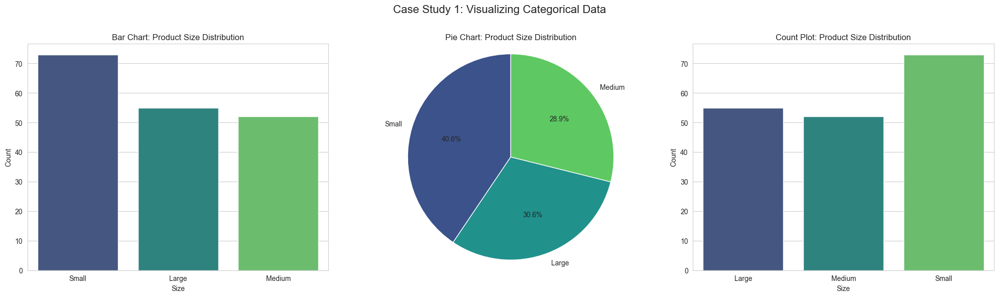

Case Study 1 Conclusion: Categorical Data Visualization
For categorical data like product sizes:
- Bar charts provide clear comparison of counts or frequencies
- Pie charts work well when showing proportion to the whole (with few categories)
- Count plots are a direct way to visualize frequency distributions

Best choice for this data: Bar Chart or Count Plot for clarity in count comparison


In [16]:
# Case Study 1: Categorical Data - Product Size Distribution
size_counts = sales_df['Size'].value_counts().reset_index()
size_counts.columns = ['Size', 'Count']

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Bar chart for categorical data
sns.barplot(x='Size', y='Count', data=size_counts, palette='viridis', ax=axes[0])
axes[0].set_title('Bar Chart: Product Size Distribution')
axes[0].set_xlabel('Size')
axes[0].set_ylabel('Count')

# Pie chart for categorical composition
axes[1].pie(size_counts['Count'], labels=size_counts['Size'], autopct='%1.1f%%',
           startangle=90, colors=sns.color_palette('viridis', len(size_counts)))
axes[1].set_title('Pie Chart: Product Size Distribution')
axes[1].axis('equal')

# Count plot as an alternative
sns.countplot(x='Size', data=sales_df, palette='viridis', ax=axes[2])
axes[2].set_title('Count Plot: Product Size Distribution')
axes[2].set_xlabel('Size')
axes[2].set_ylabel('Count')

plt.suptitle('Case Study 1: Visualizing Categorical Data', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.85)
plt.show()

# Conclusion for Case Study 1
print("Case Study 1 Conclusion: Categorical Data Visualization")
print("For categorical data like product sizes:")
print("- Bar charts provide clear comparison of counts or frequencies")
print("- Pie charts work well when showing proportion to the whole (with few categories)")
print("- Count plots are a direct way to visualize frequency distributions")
print("\nBest choice for this data: Bar Chart or Count Plot for clarity in count comparison")

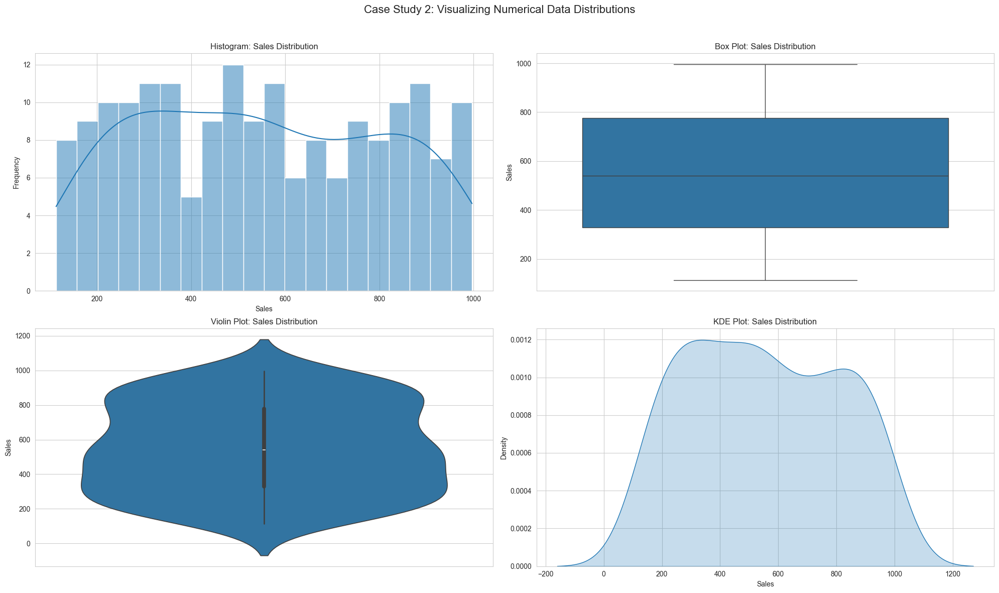

Case Study 2 Conclusion: Numerical Data Distribution Visualization
For numerical data distributions like sales:
- Histograms show frequency distribution and overall shape
- Box plots summarize key statistics (median, quartiles, outliers)
- Violin plots combine box plot information with distribution shape
- KDE plots provide smooth probability density estimates

Best choices for this data:
- Histogram: When you need to see actual frequency counts
- Box plot: When you need statistical summary and outlier detection
- Violin plot: When you need both statistical summary and distribution shape


In [17]:
# Case Study 2: Numerical Data - Sales Distribution
fig, axes = plt.subplots(2, 2, figsize=(20, 12))

# Histogram for numerical distribution
sns.histplot(sales_df['Sales'], bins=20, kde=True, ax=axes[0, 0])
axes[0, 0].set_title('Histogram: Sales Distribution')
axes[0, 0].set_xlabel('Sales')
axes[0, 0].set_ylabel('Frequency')

# Box plot for numerical distribution summary
sns.boxplot(y=sales_df['Sales'], ax=axes[0, 1])
axes[0, 1].set_title('Box Plot: Sales Distribution')
axes[0, 1].set_ylabel('Sales')

# Violin plot for numerical distribution detail
sns.violinplot(y=sales_df['Sales'], ax=axes[1, 0])
axes[1, 0].set_title('Violin Plot: Sales Distribution')
axes[1, 0].set_ylabel('Sales')

# KDE plot for smooth distribution estimate
sns.kdeplot(sales_df['Sales'], fill=True, ax=axes[1, 1])
axes[1, 1].set_title('KDE Plot: Sales Distribution')
axes[1, 1].set_xlabel('Sales')
axes[1, 1].set_ylabel('Density')

plt.suptitle('Case Study 2: Visualizing Numerical Data Distributions', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.show()

# Conclusion for Case Study 2
print("Case Study 2 Conclusion: Numerical Data Distribution Visualization")
print("For numerical data distributions like sales:")
print("- Histograms show frequency distribution and overall shape")
print("- Box plots summarize key statistics (median, quartiles, outliers)")
print("- Violin plots combine box plot information with distribution shape")
print("- KDE plots provide smooth probability density estimates")
print("\nBest choices for this data:")
print("- Histogram: When you need to see actual frequency counts")
print("- Box plot: When you need statistical summary and outlier detection")
print("- Violin plot: When you need both statistical summary and distribution shape")

In [20]:
# # Case Study 3: Time Series Data - Monthly Sales Trends
# # Prepare monthly data
# monthly_data = sales_df.groupby('Month')['Sales'].sum().reset_index()
# # Reorder months chronologically
# month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
# month_map = {month: i for i, month in enumerate(month_order)}
# monthly_data['Month_Num'] = monthly_data['Month'].map(month_map)
# monthly_data = monthly_data.sort_values('Month_Num')

# fig, axes = plt.subplots(2, 2, figsize=(20, 12))

# # Line chart for time series
# sns.lineplot(x='Month', y='Sales', data=monthly_data, marker='o', sort=False, ax=axes[0, 0])
# axes[0, 0].set_title('Line Chart: Monthly Sales Trend')
# axes[0, 0].set_xlabel('Month')
# axes[0, 0].set_ylabel('Total Sales')
# axes[0, 0].set_xticklabels(monthly_data['Month'], rotation=45)

# # Bar chart for time series
# sns.barplot(x='Month', y='Sales', data=monthly_data, palette='viridis', ax=axes[0, 1])
# axes[0, 1].set_title('Bar Chart: Monthly Sales')
# axes[0, 1].set_xlabel('Month')
# axes[0, 1].set_ylabel('Total Sales')
# axes[0, 1].set_xticklabels(monthly_data['Month'], rotation=45)

# # Area chart for time series
# monthly_data.plot.area(x='Month', y='Sales', ax=axes[1, 0], alpha=0.7)
# axes[1, 0].set_title('Area Chart: Monthly Sales')
# axes[1, 0].set_xlabel('Month')
# axes[1, 0].set_ylabel('Total Sales')
# axes[1, 0].set_xticklabels(monthly_data['Month'], rotation=45)

# # Step chart for time series (showing discrete changes)
# axes[1, 1].step(range(len(monthly_data)), monthly_data['Sales'], where='mid', color='green', linewidth=2)
# axes[1, 1].set_title('Step Chart: Monthly Sales Changes')
# axes[1, 1].set_xlabel('Month')
# axes[1, 1].set_ylabel('Total Sales')
# axes[1, 1].set_xticks(range(len(monthly_data)))
# axes[1, 1].set_xticklabels(monthly_data['Month'], rotation=45)

# plt.suptitle('Case Study 3: Visualizing Time Series Data', fontsize=16)
# plt.tight_layout()
# plt.subplots_adjust(top=0.90)
# plt.show()

# # Conclusion for Case Study 3
# print("Case Study 3 Conclusion: Time Series Data Visualization")
# print("For time series data like monthly sales:")
# print("- Line charts are ideal for showing continuous trends and patterns over time")
# print("- Bar charts work well for comparing discrete time periods")
# print("- Area charts emphasize magnitude and cumulative values over time")
# print("- Step charts highlight discrete changes between time points")
# print("\nBest choice for this data:")
# print("- Line chart: When showing overall trend is the primary goal")
# print("- Bar chart: When comparing individual time periods is more important")
# print("- Area chart: When emphasizing the magnitude of values over time")

```
ValueError: The number of FixedLocator locations (8), usually from a call to set_ticks, does not match the number of labels (12).
```

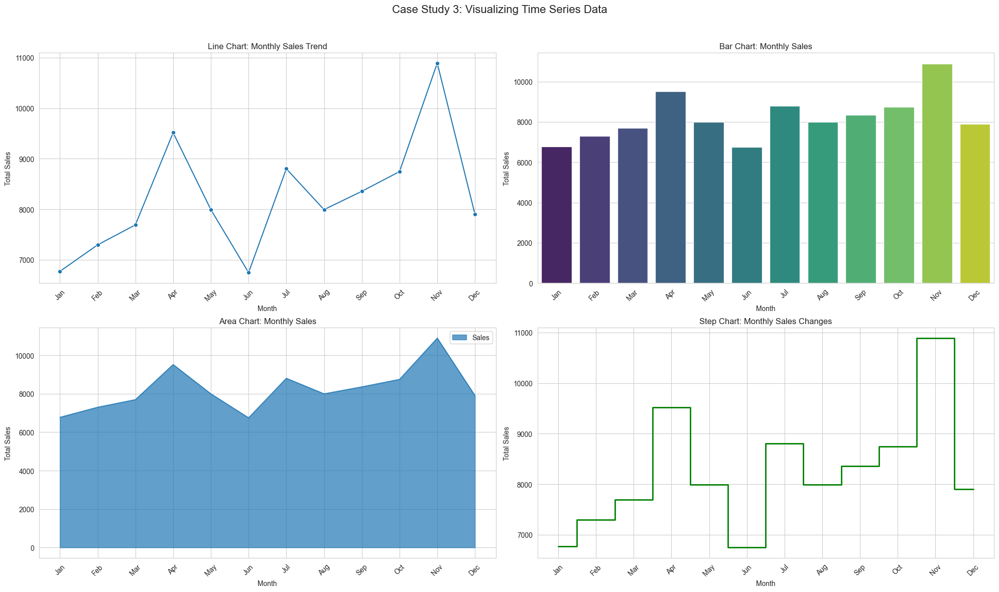

Case Study 3 Conclusion: Time Series Data Visualization
For time series data like monthly sales:
- Line charts are ideal for showing continuous trends and patterns over time
- Bar charts work well for comparing discrete time periods
- Area charts emphasize magnitude and cumulative values over time
- Step charts highlight discrete changes between time points

Best choice for this data:
- Line chart: When showing overall trend is the primary goal
- Bar chart: When comparing individual time periods is more important
- Area chart: When emphasizing the magnitude of values over time


In [21]:
# Case Study 3: Time Series Data - Monthly Sales Trends
# Prepare monthly data
monthly_data = sales_df.groupby('Month')['Sales'].sum().reset_index()

# Reorder months chronologically
month_order = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
               'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
month_map = {month: i for i, month in enumerate(month_order)}
monthly_data['Month_Num'] = monthly_data['Month'].map(month_map)
monthly_data = monthly_data.sort_values('Month_Num').reset_index(drop=True)

fig, axes = plt.subplots(2, 2, figsize=(20, 12))

# Line chart
sns.lineplot(x='Month', y='Sales', data=monthly_data, marker='o', sort=False, ax=axes[0, 0])
axes[0, 0].set_title('Line Chart: Monthly Sales Trend')
axes[0, 0].set_xlabel('Month')
axes[0, 0].set_ylabel('Total Sales')
axes[0, 0].set_xticks(range(len(monthly_data)))
axes[0, 0].set_xticklabels(monthly_data['Month'], rotation=45)

# Bar chart
sns.barplot(x='Month', y='Sales', data=monthly_data, palette='viridis', ax=axes[0, 1])
axes[0, 1].set_title('Bar Chart: Monthly Sales')
axes[0, 1].set_xlabel('Month')
axes[0, 1].set_ylabel('Total Sales')
axes[0, 1].set_xticks(range(len(monthly_data)))
axes[0, 1].set_xticklabels(monthly_data['Month'], rotation=45)

# Area chart
monthly_data.plot.area(x='Month', y='Sales', ax=axes[1, 0], alpha=0.7)
axes[1, 0].set_title('Area Chart: Monthly Sales')
axes[1, 0].set_xlabel('Month')
axes[1, 0].set_ylabel('Total Sales')
axes[1, 0].set_xticks(range(len(monthly_data)))
axes[1, 0].set_xticklabels(monthly_data['Month'], rotation=45)

# Step chart
axes[1, 1].step(range(len(monthly_data)), monthly_data['Sales'], where='mid', color='green', linewidth=2)
axes[1, 1].set_title('Step Chart: Monthly Sales Changes')
axes[1, 1].set_xlabel('Month')
axes[1, 1].set_ylabel('Total Sales')
axes[1, 1].set_xticks(range(len(monthly_data)))
axes[1, 1].set_xticklabels(monthly_data['Month'], rotation=45)

plt.suptitle('Case Study 3: Visualizing Time Series Data', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.show()

# Conclusion for Case Study 3
print("Case Study 3 Conclusion: Time Series Data Visualization")
print("For time series data like monthly sales:")
print("- Line charts are ideal for showing continuous trends and patterns over time")
print("- Bar charts work well for comparing discrete time periods")
print("- Area charts emphasize magnitude and cumulative values over time")
print("- Step charts highlight discrete changes between time points")
print("\nBest choice for this data:")
print("- Line chart: When showing overall trend is the primary goal")
print("- Bar chart: When comparing individual time periods is more important")
print("- Area chart: When emphasizing the magnitude of values over time")

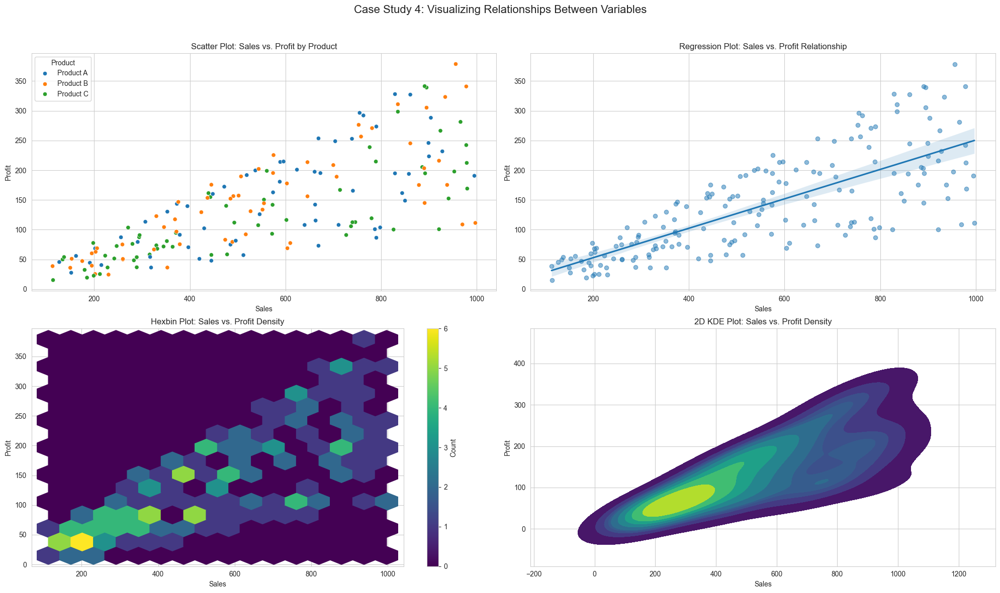

Case Study 4 Conclusion: Relationship Data Visualization
For relationship data like Sales vs. Profit:
- Scatter plots reveal patterns, clusters, and outliers in relationships
- Regression plots highlight the trend and correlation between variables
- Hexbin plots work well for large datasets by showing point density
- 2D KDE plots show the probability density of the relationship

Best choice for this data:
- Scatter plot: When individual data points and categories are important
- Regression plot: When the trend and correlation are the focus
- Hexbin or 2D KDE: When dealing with large datasets where overplotting is a concern


In [22]:
# Case Study 4: Relationship Data - Sales vs. Profit across Products
fig, axes = plt.subplots(2, 2, figsize=(20, 12))

# Scatter plot for relationship data
sns.scatterplot(x='Sales', y='Profit', hue='Product', data=sales_df, ax=axes[0, 0])
axes[0, 0].set_title('Scatter Plot: Sales vs. Profit by Product')
axes[0, 0].set_xlabel('Sales')
axes[0, 0].set_ylabel('Profit')

# Regression plot for relationship with trend
sns.regplot(x='Sales', y='Profit', data=sales_df, ax=axes[0, 1], scatter_kws={'alpha': 0.5})
axes[0, 1].set_title('Regression Plot: Sales vs. Profit Relationship')
axes[0, 1].set_xlabel('Sales')
axes[0, 1].set_ylabel('Profit')

# Hexbin plot for density in relationship (useful for large datasets)
hexplot = axes[1, 0].hexbin(sales_df['Sales'], sales_df['Profit'], gridsize=15, cmap='viridis')
axes[1, 0].set_title('Hexbin Plot: Sales vs. Profit Density')
axes[1, 0].set_xlabel('Sales')
axes[1, 0].set_ylabel('Profit')
fig.colorbar(hexplot, ax=axes[1, 0], label='Count')

# 2D KDE plot for relationship density
sns.kdeplot(x='Sales', y='Profit', data=sales_df, fill=True, ax=axes[1, 1], cmap='viridis')
axes[1, 1].set_title('2D KDE Plot: Sales vs. Profit Density')
axes[1, 1].set_xlabel('Sales')
axes[1, 1].set_ylabel('Profit')

plt.suptitle('Case Study 4: Visualizing Relationships Between Variables', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.show()

# Conclusion for Case Study 4
print("Case Study 4 Conclusion: Relationship Data Visualization")
print("For relationship data like Sales vs. Profit:")
print("- Scatter plots reveal patterns, clusters, and outliers in relationships")
print("- Regression plots highlight the trend and correlation between variables")
print("- Hexbin plots work well for large datasets by showing point density")
print("- 2D KDE plots show the probability density of the relationship")
print("\nBest choice for this data:")
print("- Scatter plot: When individual data points and categories are important")
print("- Regression plot: When the trend and correlation are the focus")
print("- Hexbin or 2D KDE: When dealing with large datasets where overplotting is a concern")

## 8. Best Practices and Common Mistakes

This section covers best practices for effective data visualization and common mistakes to avoid.

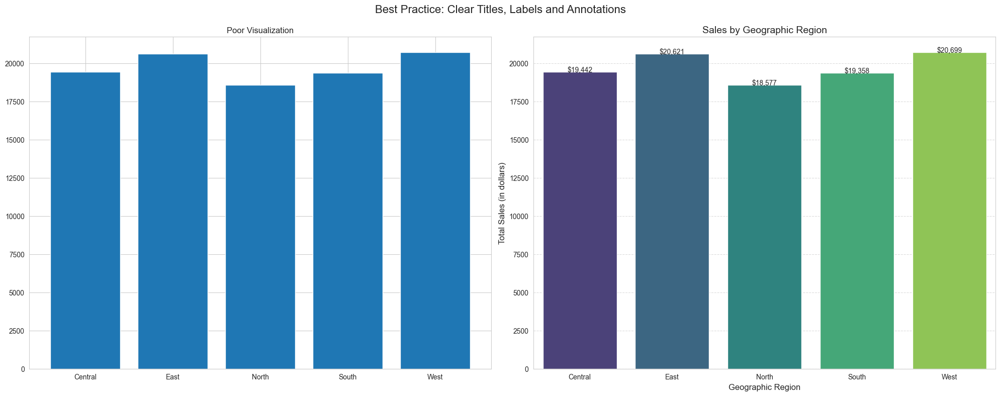

Best Practice 1: Always use clear titles, labels, and annotations
- Titles should be descriptive and explain what the chart shows
- Axis labels should include units where appropriate
- Consider adding data labels for important values
- Use grid lines to help with value interpretation


In [23]:
# Example 1: Setting Proper Titles, Labels and Legends
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Bad Example - Missing or inadequate labels
region_sales = sales_df.groupby('Region')['Sales'].sum().reset_index()
ax1.bar(region_sales['Region'], region_sales['Sales'])
ax1.set_title('Poor Visualization')

# Good Example - Clear title, labels, and formatting
sns.barplot(x='Region', y='Sales', data=region_sales, palette='viridis', ax=ax2)
ax2.set_title('Sales by Geographic Region', fontsize=14)
ax2.set_xlabel('Geographic Region', fontsize=12)
ax2.set_ylabel('Total Sales (in dollars)', fontsize=12)
ax2.tick_params(labelsize=10)
ax2.grid(axis='y', linestyle='--', alpha=0.7)
for i, v in enumerate(region_sales['Sales']):
    ax2.text(i, v + 5, f'${v:,.0f}', ha='center', fontsize=10)

plt.suptitle('Best Practice: Clear Titles, Labels and Annotations', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.show()

print("Best Practice 1: Always use clear titles, labels, and annotations")
print("- Titles should be descriptive and explain what the chart shows")
print("- Axis labels should include units where appropriate")
print("- Consider adding data labels for important values")
print("- Use grid lines to help with value interpretation")

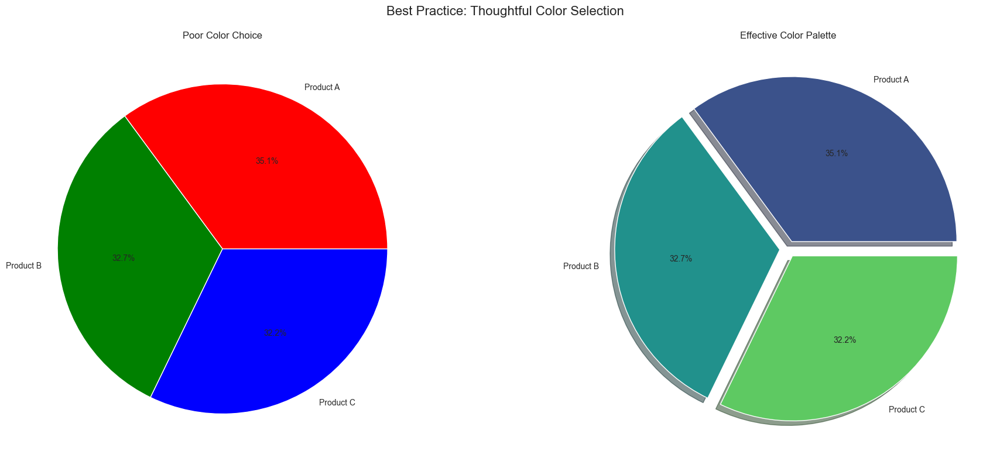

Best Practice 2: Choose appropriate color schemes
- Use colorblind-friendly palettes when possible
- Select colors that provide good contrast
- Consider cultural associations of colors
- Use color consistently throughout your visualizations
- Limit the number of colors to avoid confusion


In [24]:
# Example 2: Appropriate Color Choices
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Bad Example - Poor color choices
product_sales = sales_df.groupby('Product')['Sales'].sum()
colors = ['red', 'green', 'blue']  # Colors that may not work well together or for colorblind viewers
ax1.pie(product_sales, labels=product_sales.index, autopct='%1.1f%%', colors=colors)
ax1.set_title('Poor Color Choice')

# Good Example - Well-chosen color palette
ax2.pie(product_sales, labels=product_sales.index, autopct='%1.1f%%', 
        colors=sns.color_palette('viridis', len(product_sales)),
        explode=[0.05] * len(product_sales),  # Slight separation for clarity
        shadow=True)
ax2.set_title('Effective Color Palette')

plt.suptitle('Best Practice: Thoughtful Color Selection', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.show()

print("Best Practice 2: Choose appropriate color schemes")
print("- Use colorblind-friendly palettes when possible")
print("- Select colors that provide good contrast")
print("- Consider cultural associations of colors")
print("- Use color consistently throughout your visualizations")
print("- Limit the number of colors to avoid confusion")

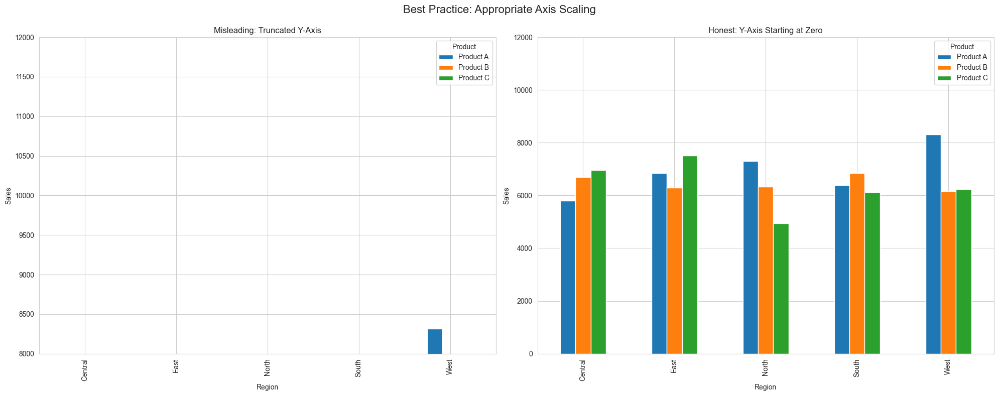

Best Practice 3: Use appropriate axis scaling
- Bar charts should generally start at zero to avoid misleading comparisons
- Consider using a broken axis if zero creates too much empty space
- Choose logical increments for tick marks
- Indicate clearly if using logarithmic scales
- Label any axis breaks or scale changes


In [25]:
# Example 3: Appropriate Axis Scaling
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Create example data with a large range
region_product = sales_df.groupby(['Region', 'Product'])['Sales'].sum().reset_index()
region_product_pivot = region_product.pivot(index='Region', columns='Product', values='Sales')

# Bad Example - Truncated y-axis leading to exaggeration of differences
region_product_pivot.plot(kind='bar', ax=ax1)
ax1.set_title('Misleading: Truncated Y-Axis')
ax1.set_ylim(8000, 12000)  # Truncated y-axis exaggerates differences
ax1.set_ylabel('Sales')

# Good Example - Full y-axis starting from 0
region_product_pivot.plot(kind='bar', ax=ax2)
ax2.set_title('Honest: Y-Axis Starting at Zero')
ax2.set_ylim(0, 12000)  # Y-axis starts from 0 for fair comparison
ax2.set_ylabel('Sales')

plt.suptitle('Best Practice: Appropriate Axis Scaling', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.90)
plt.show()

print("Best Practice 3: Use appropriate axis scaling")
print("- Bar charts should generally start at zero to avoid misleading comparisons")
print("- Consider using a broken axis if zero creates too much empty space")
print("- Choose logical increments for tick marks")
print("- Indicate clearly if using logarithmic scales")
print("- Label any axis breaks or scale changes")

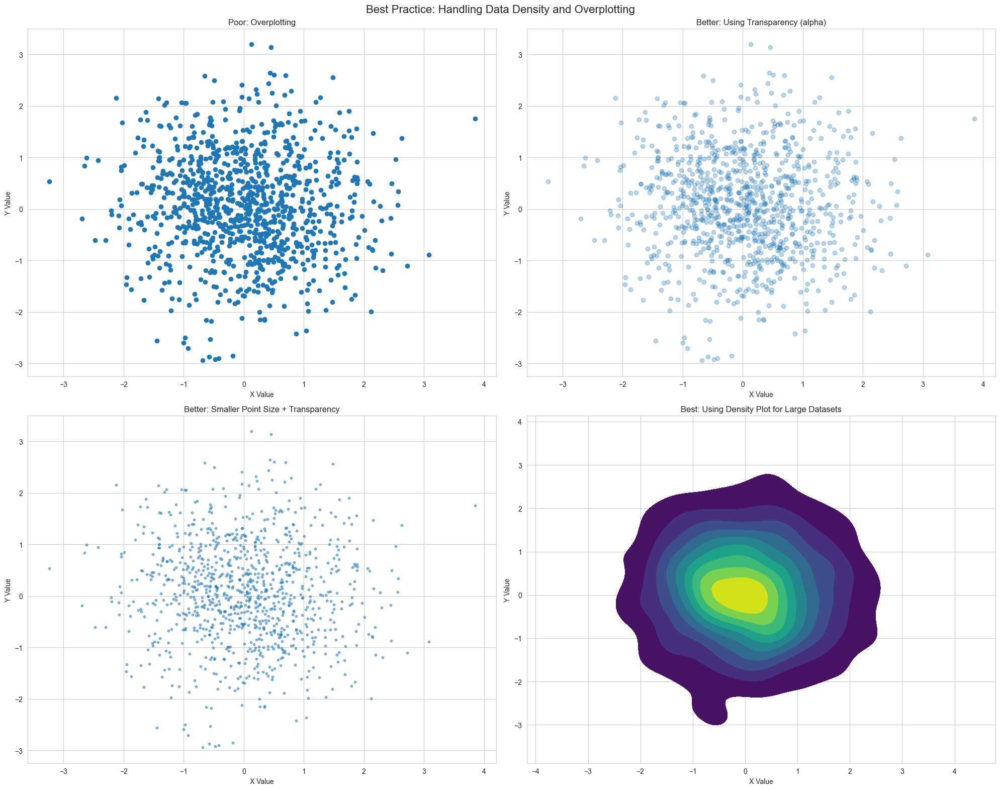

Best Practice 4: Handle data density appropriately
- Use transparency (alpha) to show overlap in dense scatter plots
- Reduce point size for large datasets
- Consider alternative visualizations like hexbin or density plots for very large datasets
- Use sampling techniques when appropriate
- Consider 2D histograms or contour plots for extremely dense data


In [26]:
# Example 4: Handling Data Density and Overplotting
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))

# Create a larger dataset for demonstration
np.random.seed(42)
large_data = pd.DataFrame({
    'x': np.random.normal(0, 1, 1000),
    'y': np.random.normal(0, 1, 1000),
    'group': np.random.choice(['A', 'B', 'C', 'D'], 1000)
})

# Bad Example - Overplotting with regular scatter plot
ax1.scatter(large_data['x'], large_data['y'])
ax1.set_title('Poor: Overplotting')
ax1.set_xlabel('X Value')
ax1.set_ylabel('Y Value')

# Good Example 1 - Transparency to handle overplotting
ax2.scatter(large_data['x'], large_data['y'], alpha=0.3)
ax2.set_title('Better: Using Transparency (alpha)')
ax2.set_xlabel('X Value')
ax2.set_ylabel('Y Value')

# Good Example 2 - Using smaller point size
ax3.scatter(large_data['x'], large_data['y'], s=10, alpha=0.5)
ax3.set_title('Better: Smaller Point Size + Transparency')
ax3.set_xlabel('X Value')
ax3.set_ylabel('Y Value')

# Good Example 3 - Using density plot instead
sns.kdeplot(x='x', y='y', data=large_data, fill=True, cmap='viridis', ax=ax4)
ax4.set_title('Best: Using Density Plot for Large Datasets')
ax4.set_xlabel('X Value')
ax4.set_ylabel('Y Value')

plt.suptitle('Best Practice: Handling Data Density and Overplotting', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

print("Best Practice 4: Handle data density appropriately")
print("- Use transparency (alpha) to show overlap in dense scatter plots")
print("- Reduce point size for large datasets")
print("- Consider alternative visualizations like hexbin or density plots for very large datasets")
print("- Use sampling techniques when appropriate")
print("- Consider 2D histograms or contour plots for extremely dense data")

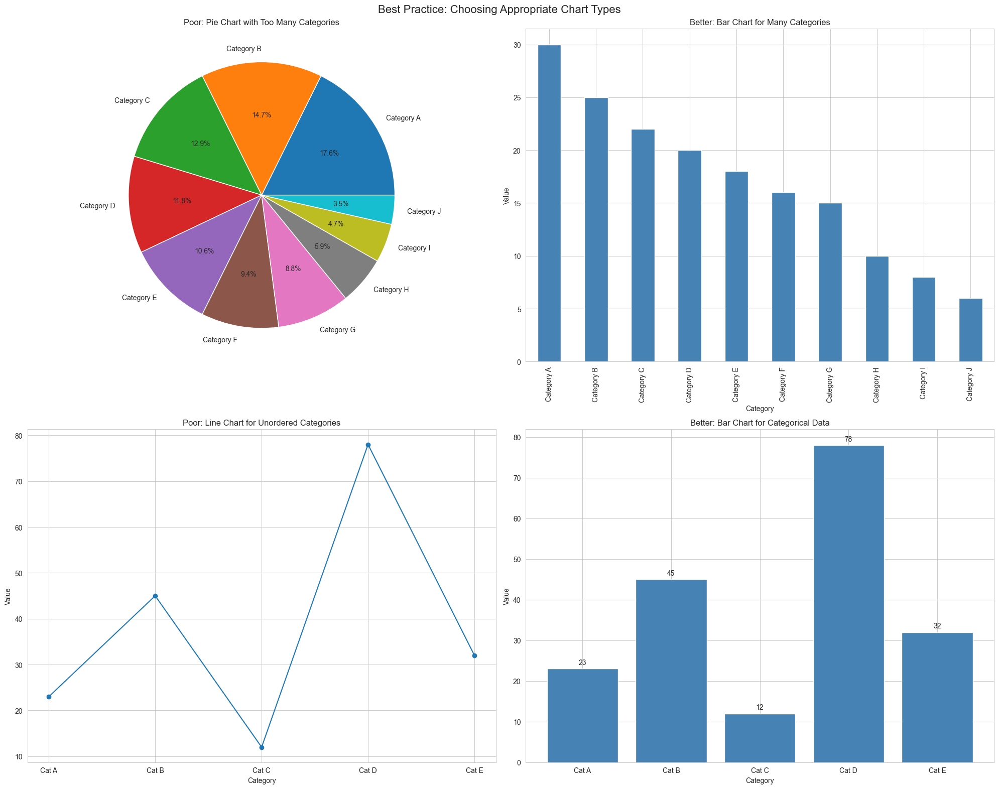

Best Practice 5: Choose the right chart for your data
- Pie charts work best with few categories (≤ 6)
- Use bar charts when comparing many categories
- Use line charts for continuous data or ordered categories (like time)
- Don't connect unrelated points with lines
- Match the chart type to your data characteristics and analysis goal


In [27]:
# Example 5: Choosing Appropriate Chart Types
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 16))

# Create example data
category_data = pd.Series({
    'Category A': 30,
    'Category B': 25,
    'Category C': 22,
    'Category D': 20,
    'Category E': 18,
    'Category F': 16,
    'Category G': 15,
    'Category H': 10,
    'Category I': 8,
    'Category J': 6
})

# Bad Example 1 - Too many categories in a pie chart
ax1.pie(category_data, labels=category_data.index, autopct='%1.1f%%')
ax1.set_title('Poor: Pie Chart with Too Many Categories')

# Good Example 1 - Using bar chart instead
category_data.sort_values(ascending=False).plot.bar(ax=ax2, color='steelblue')
ax2.set_title('Better: Bar Chart for Many Categories')
ax2.set_xlabel('Category')
ax2.set_ylabel('Value')

# Bad Example 2 - Using line chart for unordered categories
categories = ['Cat A', 'Cat B', 'Cat C', 'Cat D', 'Cat E']
values = [23, 45, 12, 78, 32]
ax3.plot(categories, values, marker='o', linestyle='-')
ax3.set_title('Poor: Line Chart for Unordered Categories')
ax3.set_xlabel('Category')
ax3.set_ylabel('Value')

# Good Example 2 - Using bar chart for categorical data
ax4.bar(categories, values, color='steelblue')
ax4.set_title('Better: Bar Chart for Categorical Data')
ax4.set_xlabel('Category')
ax4.set_ylabel('Value')
for i, v in enumerate(values):
    ax4.text(i, v + 1, str(v), ha='center')

plt.suptitle('Best Practice: Choosing Appropriate Chart Types', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.95)
plt.show()

print("Best Practice 5: Choose the right chart for your data")
print("- Pie charts work best with few categories (≤ 6)")
print("- Use bar charts when comparing many categories")
print("- Use line charts for continuous data or ordered categories (like time)")
print("- Don't connect unrelated points with lines")
print("- Match the chart type to your data characteristics and analysis goal")

## Summary and Conclusion

In this notebook, we've explored:

1. **Various chart types** and when to use each one based on data characteristics and analysis goals
2. **Decision frameworks** for selecting the most appropriate visualization
3. **Comparisons of different charts** using the same dataset to see how visualization choices impact data interpretation
4. **Case studies** demonstrating effective visualization for different types of data
5. **Best practices** for creating clear, informative, and honest visualizations

### Key Takeaways:

- The right chart type depends on your data structure, analysis goal, and audience
- Consider what message you want to convey before choosing a visualization
- Follow best practices for clarity, accessibility, and honesty in visualization
- Different chart types can reveal different insights from the same data
- Effective data visualization is both a science and an art - practice improves your skills

Remember that the goal of data visualization is to communicate insights clearly and effectively. The best visualization is the one that helps your audience understand the data and make informed decisions.